## Part 0: Preprocessing Data
This Part consist of adding necessary tools such as libraries and importing dataset and then cleaning data in order to implement required algorithm.

In [1]:
import numpy as np #to help us use numerical functions
import pandas as pd #to help us use functions for dealing with dataframe
import os #provides functions for creating and removing a directory

In order to avoid uploading manually by running below codes we load data from kaggle by using API command

In [2]:
# install kaggle library
! pip install kaggle

In [3]:
#creating a directory named kaggle
! mkdir ~/.kaggle

In [4]:
# copying kaggle.json to new directory
! cp kaggle.json ~/.kaggle/

In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
# downloading dataset
!kaggle datasets download -d rounakbanik/the-movies-dataset

 98% 223M/228M [00:01<00:00, 171MB/s]
100% 228M/228M [00:01<00:00, 138MB/s]


In [7]:
#creating a new directory in order to unzip dataset overthere
!mkdir the-movies-dataset

In [8]:
!unzip 'the-movies-dataset.zip' -d /content/the-movies-dataset

Archive:  the-movies-dataset.zip
  inflating: /content/the-movies-dataset/credits.csv  
  inflating: /content/the-movies-dataset/keywords.csv  
  inflating: /content/the-movies-dataset/links.csv  
  inflating: /content/the-movies-dataset/links_small.csv  
  inflating: /content/the-movies-dataset/movies_metadata.csv  
  inflating: /content/the-movies-dataset/ratings.csv  
  inflating: /content/the-movies-dataset/ratings_small.csv  


Now we Import our CSV files<br>
At this project we work with 'credits.csv', 'keywords.csv', 'movies_metadata.csv', 'rating.csv'

In [9]:
#Importing necessary csv files as pandas dataframe

#movies_metadata.csv
movies_metadata = pd.read_csv('/content/the-movies-dataset/movies_metadata.csv', low_memory = False) # setting low memory to False because guessing dtypes for each column is very memory demanding.
print("shape of movies_metadata: {}".format(movies_metadata.shape)) #checking dimension of data

#credits.csv
credits = pd.read_csv('/content/the-movies-dataset/credits.csv', low_memory = False)
print("shape of credits: {}".format(credits.shape))

#keywords.csv
keywords = pd.read_csv('/content/the-movies-dataset/keywords.csv', low_memory = False)
print("shape of keywords: {}".format(keywords.shape))

#ratings.csv
ratings = pd.read_csv('/content/the-movies-dataset/ratings.csv', low_memory = False)
print("shape of ratings: {}".format(ratings.shape))

shape of movies_metadata: (45466, 24)
shape of credits: (45476, 3)
shape of keywords: (46419, 2)
shape of ratings: (26024289, 4)


In [10]:
#in order to access full view of all dataframes
pd.set_option('display.max_columns', None)

In [11]:
#viewing top 5 rows of metadata
movies_metadata.head(5)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [12]:
#checking credits
credits.head(5)

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862


In [13]:
#checking keywords
keywords.head(5)

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."


In [14]:
#checking ratings
ratings.head(5)

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523
3,1,1221,5.0,1425941546
4,1,1246,5.0,1425941556


Making a bigger dataset for movies by merging movies_metadata and credits and keywords

but before it we need to delete rows with Nan

In [15]:
movies_metadata.isna().sum()

adult                        0
belongs_to_collection    40972
budget                       0
genres                       0
homepage                 37684
id                           0
imdb_id                     17
original_language           11
original_title               0
overview                   954
popularity                   5
poster_path                386
production_companies         3
production_countries         3
release_date                87
revenue                      6
runtime                    263
spoken_languages             6
status                      87
tagline                  25054
title                        6
video                        6
vote_average                 6
vote_count                   6
dtype: int64

for now It's tolerable to have NaN at 'homepage', 'imdb_id', 'overview', 'poster_path', 'production_companies', 'production_countries', 'release_date', 'revenue', 'runtime', 'status', 'title' but we need to delete all rows which have NaN at 'popularity', 'vote_average', 'vote_count'

In [16]:
movies_metadata = movies_metadata.dropna(subset=['popularity', 'vote_average', 'vote_count'])
movies_metadata.shape

(45460, 24)

In [17]:
credits.isna().sum()

cast    0
crew    0
id      0
dtype: int64

In [18]:
keywords.isna().sum()

id          0
keywords    0
dtype: int64

In [19]:
ratings.isna().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

Before merging we need to check astype of these dataframes

In [20]:
movies_metadata.dtypes

adult                     object
belongs_to_collection     object
budget                    object
genres                    object
homepage                  object
id                        object
imdb_id                   object
original_language         object
original_title            object
overview                  object
popularity                object
poster_path               object
production_companies      object
production_countries      object
release_date              object
revenue                  float64
runtime                  float64
spoken_languages          object
status                    object
tagline                   object
title                     object
video                     object
vote_average             float64
vote_count               float64
dtype: object

In [21]:
credits.dtypes

cast    object
crew    object
id       int64
dtype: object

In [22]:
keywords.dtypes

id           int64
keywords    object
dtype: object

In [23]:
ratings.dtypes

userId         int64
movieId        int64
rating       float64
timestamp      int64
dtype: object

in order to merge those 3 dataframes all "id" columns need to set int and 'id' at keywords and credits is int64 so we change type of 'id' at movies_metadata to int64

In [24]:
movies_metadata['id'] = movies_metadata['id'].astype('int64')

Now We can merge theme together

In [25]:
movies_df = movies_metadata.merge(credits, on='id')
movies_df = movies_df.merge(keywords, on='id')
movies_df.shape

(46624, 27)

In [26]:
#viewing new movies_df
movies_df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,cast,crew,keywords
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...","[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...","[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...","[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...","[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...","[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."


In order to make it easier for us at next steps and approachs We need to clean some columns and these columns are:<br>
'belongs_to_collection', 'genres', 'production_companies', 'production_countries', 'spoken_languages', 'cast', 'crew', 'keywords'


we need to only catch neccessary things of above columns so we use below function

In order to clean data we need to import ast module which help us to convert string to dictionary so easily we can get what we want

In [27]:
import ast

In [28]:
#deining a function to get name of collection
def get_collection(x):
  x = ast.literal_eval(x) #converting type from string to dictionary
  return x['name']


In [29]:
#checking if function works or not
get_collection(movies_df.loc[0,'belongs_to_collection'])

'Toy Story Collection'

In [30]:
#applying function on whole column
for i in range(len(movies_df)):
  if pd.isnull(movies_df.loc[i, 'belongs_to_collection']): #pass nan data
    pass
  else:
    movies_df.loc[i,'belongs_to_collection'] = get_collection(movies_df.loc[i,'belongs_to_collection'])

Nice Now this column is clean let's do the same for rest

In [31]:
#defining a function to catch a list of genres
def get_genre(x):
  x = x.replace("[", "")  #removing brackets in order to not having a list after using ast module
  x = x.replace("]", "")
  x = ast.literal_eval(x) #changing type of x
  z = []
  #since once we have multiple genres type of x will be tuple and if we have one genre type of x will be dict and we need different functions for each
  if type(x) == dict:
    z.append(x['name'])
  else:
    for i in range(len(x)):
      z.append(x[i]['name'])
  strz = "" #we do this because we need to transform it to string once again so we can replace it
  for j in range(len(z)):
    strz += z[j] + ", "
  return strz[:-2]

In [32]:
#applying function on whole column
for i in range(len(movies_df)):
  if movies_df.loc[i,'genres'] == "[]":
    pass
  else:
    movies_df.loc[i,'genres'] = get_genre(movies_df.loc[i,'genres'])

need to check for nan again

In [33]:
movies_df.isna().sum()

adult                        0
belongs_to_collection    42051
budget                       0
genres                       0
homepage                 38616
id                           0
imdb_id                     17
original_language           11
original_title               0
overview                   995
popularity                   0
poster_path                395
production_companies         0
production_countries         0
release_date                84
revenue                      0
runtime                    264
spoken_languages             0
status                      82
tagline                  25841
title                        0
video                        0
vote_average                 0
vote_count                   0
cast                         0
crew                         0
keywords                     0
dtype: int64

this is good because we don't need to deal with nan in new columns we want to clean

In [34]:
#defining a function to catch a list of genres
def get_name(x):
  x = x.replace("[", "")  #removing brackets in order to not having a list after using ast module
  x = x.replace("]", "")
  x = ast.literal_eval(x)
  z = []
  #since once we have multiple genres type of x will be tuple and if we have one genre type of x will be dict and we need different functions for each
  if type(x) == dict:
    z.append(x['name'])
  else:
    for i in range(len(x)):
      z.append(x[i]['name'])
  strz = "" #we do this because we need to transform it to string once again so we can replace it
  for j in range(len(z)):
    strz += z[j] + ", "
  return strz[:-2]

In [35]:
#applying function on whole column
for i in range(len(movies_df)):
  if movies_df.loc[i,'production_companies'] == "[]":
    pass
  else:
    movies_df.loc[i,'production_companies'] = get_name(movies_df.loc[i,'production_companies'])

Let's go to clean production country column<br>
no need to define a new function we can use previous get_name function or this one as well

In [36]:
#applying function on whole column
for i in range(len(movies_df)):
  if movies_df.loc[i,'production_countries'] == "[]":
    pass
  else:
    movies_df.loc[i,'production_countries'] = get_name(movies_df.loc[i,'production_countries'])

Let's clean 'spoken_languages'

In [37]:
#applying function on whole column
for i in range(len(movies_df)):
  if movies_df.loc[i,'spoken_languages'] == "[]":
    pass
  else:
    movies_df.loc[i,'spoken_languages'] = get_name(movies_df.loc[i,'spoken_languages'])

Now with same function let's get keywords

In [38]:
#applying function on whole column
for i in range(len(movies_df)):
  if movies_df.loc[i,'keywords'] == "[]":
    pass
  else:
    movies_df.loc[i,'keywords'] = get_name(movies_df.loc[i,'keywords'])

And finally here we go to clean cast and crew<br>
for crew we just pick director and writer and for cast we catch actors name

In [39]:
#a function for finding director
#defining a function to catch director name
def get_crew(x):
  x = x.replace("[", "")  #removing brackets in order to not having a list after using ast module
  x = x.replace("]", "")
  x = ast.literal_eval(x)
  z = []
  if type(x) == dict: #we can't call by indices in case we're dealing with dictionary so we need to consider this loop
    if x['job'] == 'Director':
      z.append(x['name'])
  else:
    for i in range(len(x)):
      if x[i]['job'] == 'Director': #finding director among all crew
        z.append(x[i]['name'])

  strz = ""
  for j in range(len(z)):
    strz += z[j] + ", "
  return strz[:-2]

In [40]:
#applying function on a new column named director
for i in range(len(movies_df)):
  if movies_df.loc[i,'crew'] == "[]":
    movies_df.loc[i,'Director'] = "[]"
  else:
    movies_df.loc[i,'Director'] = get_crew(movies_df.loc[i,'crew'])



In [41]:
#viewing dataframe
movies_df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,cast,crew,keywords,Director
0,False,Toy Story Collection,30000000,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...","jealousy, toy, boy, friendship, friends, rival...",John Lasseter
1,False,NaN,65000000,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...","board game, disappearance, based on children's...",Joe Johnston
2,False,Grumpy Old Men Collection,0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...","fishing, best friend, duringcreditsstinger, ol...",Howard Deutch
3,False,NaN,16000000,"Comedy, Drama, Romance",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,English,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...","based on novel, interracial relationship, sing...",Forest Whitaker
4,False,Father of the Bride Collection,0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"Sandollar Productions, Touchstone Pictures",United States of America,1995-02-10,76578911.0,106.0,English,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...","baby, midlife crisis, confidence, aging, daugh...",Charles Shyer


Doing the same to find Writers

In [42]:
#defining a function to catch writer name
def get_writer(x):
  x = x.replace("[", "")  #removing brackets in order to not having a list after using ast module
  x = x.replace("]", "")
  x = ast.literal_eval(x)
  z = []
  if type(x) == dict: #we can't call by indices in case we're dealing with dictionary so we need to consider this loop
    if x['job'] == 'Writer':
      z.append(x['name'])
  else:
    for i in range(len(x)):
      if x[i]['job'] == 'Writer': #finding writer among all crew
        z.append(x[i]['name'])

  strz = ""
  for j in range(len(z)):
    strz += z[j] + ", "
  return strz[:-2]

In [43]:
#applying function on a new column named writer
for i in range(len(movies_df)):
  if movies_df.loc[i,'crew'] == "[]":
    movies_df.loc[i,'Writer'] = "[]"
  else:
    movies_df.loc[i,'Writer'] = get_writer(movies_df.loc[i,'crew'])

Now at last step of data cleaning we add a new column named cast and add all actors or actress for each movie

In [44]:
#defining a function to catch whole cast name
def get_cast(x):
  x = x.replace("[", "")  #removing brackets in order to not having a list after using ast module
  x = x.replace("]", "")
  x = ast.literal_eval(x)
  z = []
  if type(x) == dict: #we can't call by indices in case we're dealing with dictionary so we need to consider this loop
    z.append(x['name'])
  else:
    for i in range(len(x)):
      z.append(x[i]['name'])

  strz = ""
  for j in range(len(z)):
    strz += z[j] + ", "
  return strz[:-2]

In [45]:
#applying function on a new column named Cast
for i in range(len(movies_df)):
  if movies_df.loc[i,'cast'] == "[]":
    movies_df.loc[i,'Cast'] = "[]"
  else:
    movies_df.loc[i,'Cast'] = get_cast(movies_df.loc[i,'cast'])

Now we drop cast and crew columns because we already extracted useful info

In [46]:
movies_df.drop(['cast', 'crew'], axis = 1, inplace = True)

In [47]:
#viewing dataframe
movies_df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast
0,False,Toy Story Collection,30000000,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,..."
1,False,NaN,65000000,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ..."
2,False,Grumpy Old Men Collection,0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"fishing, best friend, duringcreditsstinger, ol...",Howard Deutch,Mark Steven Johnson,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph..."
3,False,NaN,16000000,"Comedy, Drama, Romance",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,English,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"based on novel, interracial relationship, sing...",Forest Whitaker,,"Whitney Houston, Angela Bassett, Loretta Devin..."
4,False,Father of the Bride Collection,0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"Sandollar Productions, Touchstone Pictures",United States of America,1995-02-10,76578911.0,106.0,English,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"baby, midlife crisis, confidence, aging, daugh...",Charles Shyer,,"Steve Martin, Diane Keaton, Martin Short, Kimb..."


In [48]:
#a quick remind that type of some of columns are object while they represent numerical data.
## first let's check them again

movies_df.dtypes

adult                     object
belongs_to_collection     object
budget                    object
genres                    object
homepage                  object
id                         int64
imdb_id                   object
original_language         object
original_title            object
overview                  object
popularity                object
poster_path               object
production_companies      object
production_countries      object
release_date              object
revenue                  float64
runtime                  float64
spoken_languages          object
status                    object
tagline                   object
title                     object
video                     object
vote_average             float64
vote_count               float64
keywords                  object
Director                  object
Writer                    object
Cast                      object
dtype: object

'budget', 'popularity', need to be float64 and 'release_date' need to be datetime

In [49]:
movies_df['budget'] = movies_df['budget'].astype(float)
movies_df['popularity'] = movies_df['popularity'].astype(float)
movies_df['release_date']= pd.to_datetime(movies_df['release_date'])

movies_df.dtypes

adult                            object
belongs_to_collection            object
budget                          float64
genres                           object
homepage                         object
id                                int64
imdb_id                          object
original_language                object
original_title                   object
overview                         object
popularity                      float64
poster_path                      object
production_companies             object
production_countries             object
release_date             datetime64[ns]
revenue                         float64
runtime                         float64
spoken_languages                 object
status                           object
tagline                          object
title                            object
video                            object
vote_average                    float64
vote_count                      float64
keywords                         object


**Performing EDA over whole data**

EDA for 'adult'

In [50]:
#checking all possible values on adult column
movies_df['adult'].unique()


array(['False', 'True'], dtype=object)

In [51]:
#counting number of True and Falses
adult_movies = []
non_adult_movies = []
for i in range(len(movies_df)):
  if movies_df.loc[i, 'adult'] == 'False':
    non_adult_movies.append(movies_df.loc[i, 'title'])
  if movies_df.loc[i, 'adult'] == 'True':
    adult_movies.append(movies_df.loc[i, 'title'])


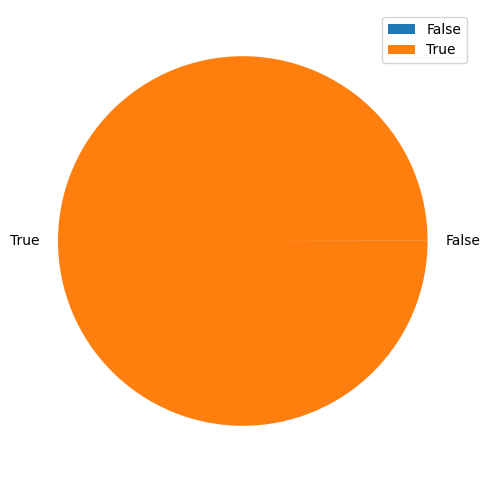

In [52]:
#Recommended to adults or not
import matplotlib.pyplot as plt #helps us to plot figures

#creating a pie chart to visualize
number_of_movies_according_to_adult = np.array([len(adult_movies), len(non_adult_movies)])
labels_of_movies_according_to_adult = list(movies_df['adult'].unique())

#plotting pie chart
plt.figure(figsize=(6,6))
plt.pie(number_of_movies_according_to_adult, labels = labels_of_movies_according_to_adult)
plt.legend()
plt.show()

As you see its just a small percentage of movies should only recommend to adults let's see percentage

In [53]:
len(adult_movies)/len(movies_df)

0.00019303363074811255

EDA for 'budget

We need to make this feature categorized so later we can use it for content based filtering<br>
for this we divide whole movies to 13 sections according to budget in million USD<br>
under-5m<br>
5-10m<br>
10-15m<br>
15-20m<br>
20-25m<br>
25-30m<br>
30-40m<br>
40-50m<br>
50-75m<br>
75-100m<br>
100-150m<br>
150-200m<br>
over 200m

In [54]:
for i in range(len(movies_df)):
  if movies_df.loc[i, 'budget'] == 0: #since there are some values equal to zero where they're actually nan
    movies_df.loc[i, 'budget_categorized'] = "budget unlnown" #creating a new column for categorized budget
  elif movies_df.loc[i, 'budget'] < 5000000:
    movies_df.loc[i, 'budget_categorized'] = "under 5m"
  elif movies_df.loc[i, 'budget'] < 10000000:
    movies_df.loc[i, 'budget_categorized'] = "5-10m"
  elif movies_df.loc[i, 'budget'] < 15000000:
    movies_df.loc[i, 'budget_categorized'] = "10-15m"
  elif movies_df.loc[i, 'budget'] < 20000000:
    movies_df.loc[i, 'budget_categorized'] = "15-20m"
  elif movies_df.loc[i, 'budget'] < 25000000:
    movies_df.loc[i, 'budget_categorized'] = "20-25m"
  elif movies_df.loc[i, 'budget'] < 30000000:
    movies_df.loc[i, 'budget_categorized'] = "25-30m"
  elif movies_df.loc[i, 'budget'] < 40000000:
    movies_df.loc[i, 'budget_categorized'] = "30-40m"
  elif movies_df.loc[i, 'budget'] < 50000000:
    movies_df.loc[i, 'budget_categorized'] = "40-50m"
  elif movies_df.loc[i, 'budget'] < 75000000:
    movies_df.loc[i, 'budget_categorized'] = "50-75m"
  elif movies_df.loc[i, 'budget'] < 100000000:
    movies_df.loc[i, 'budget_categorized'] = "75-100m"
  elif movies_df.loc[i, 'budget'] < 150000000:
    movies_df.loc[i, 'budget_categorized'] = "100-150m"
  elif movies_df.loc[i, 'budget'] < 200000000:
    movies_df.loc[i, 'budget_categorized'] = "150-200m"
  elif movies_df.loc[i, 'budget'] >= 200000000:
    movies_df.loc[i, 'budget_categorized'] = "over 200m"
  else:
    movies_df.loc[i, 'budget_categorized'] = "budget unknown"

movies_df.head(3)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m
2,False,Grumpy Old Men Collection,0.0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"fishing, best friend, duringcreditsstinger, ol...",Howard Deutch,Mark Steven Johnson,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",budget unlnown


Time to visualize distribution at new column('budget_categorized')

In [55]:
#checking list of unique values of budget_categorized
movies_df['budget_categorized'].unique()

array(['30-40m', '50-75m', 'budget unlnown', '15-20m', '40-50m',
       '75-100m', 'under 5m', '10-15m', '25-30m', '20-25m', '5-10m',
       '100-150m', '150-200m', 'over 200m'], dtype=object)

In [56]:
list_budget_categorized = list(movies_df['budget_categorized'].unique())
list_budget_categorized

['30-40m',
 '50-75m',
 'budget unlnown',
 '15-20m',
 '40-50m',
 '75-100m',
 'under 5m',
 '10-15m',
 '25-30m',
 '20-25m',
 '5-10m',
 '100-150m',
 '150-200m',
 'over 200m']

In [57]:
#creating a pie chart to visualize
number_of_budget_categorized = []
labels_of_budget_categorized = []

for i in range(len(list_budget_categorized)):
  labels_of_budget_categorized.append(list_budget_categorized[i])
  number_of_budget_categorized.append(movies_df['budget_categorized'].value_counts()[list_budget_categorized[i]])


print(len(number_of_budget_categorized))
print(len(labels_of_budget_categorized))

14
14


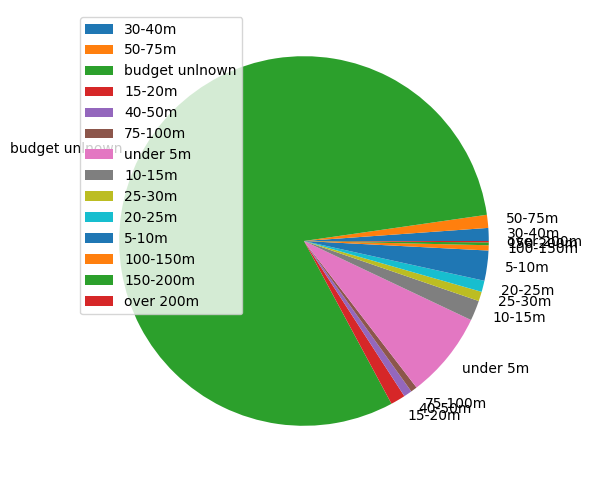

In [58]:
#plotting pie chart
plt.figure(figsize=(6,6))
plt.pie(number_of_budget_categorized, labels = labels_of_budget_categorized)
plt.legend()
plt.show()


let's try to visualize again without unknown budget

In [59]:
#removing budget unknown
del number_of_budget_categorized[labels_of_budget_categorized.index("budget unlnown")]
labels_of_budget_categorized.remove("budget unlnown")

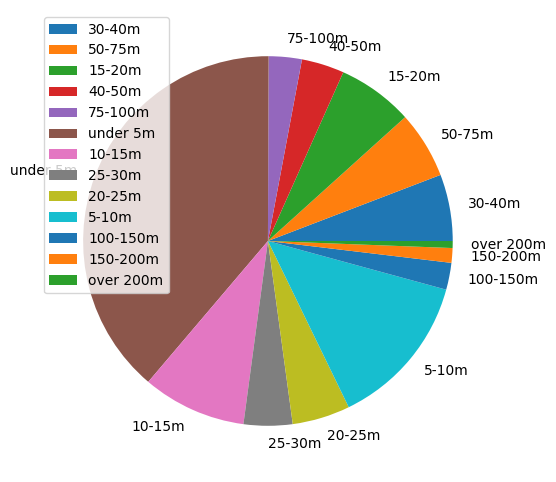

In [60]:
#plotting pie chart
plt.figure(figsize=(6,6))
plt.pie(number_of_budget_categorized, labels = labels_of_budget_categorized)
plt.legend()
plt.show()

Let's perform an EDA over top original language

In [61]:
movies_df['original_language'].value_counts().head(10)

en    32934
fr     2524
it     1565
ja     1419
de     1111
es     1026
ru      837
hi      533
ko      474
zh      420
Name: original_language, dtype: int64

In [62]:
list_of_original_languages = list(movies_df['original_language'].unique())
list_of_original_languages = list_of_original_languages[:10]

#again creating 2 list consist of label name and number for each language
number_of_original_languages = []
labels_of_original_languages = []

for i in range(len(list_of_original_languages)):
  labels_of_original_languages.append(list_of_original_languages[i])
  number_of_original_languages.append(movies_df['original_language'].value_counts()[list_of_original_languages[i]])


print(len(number_of_original_languages))
print(len(labels_of_original_languages))

10
10


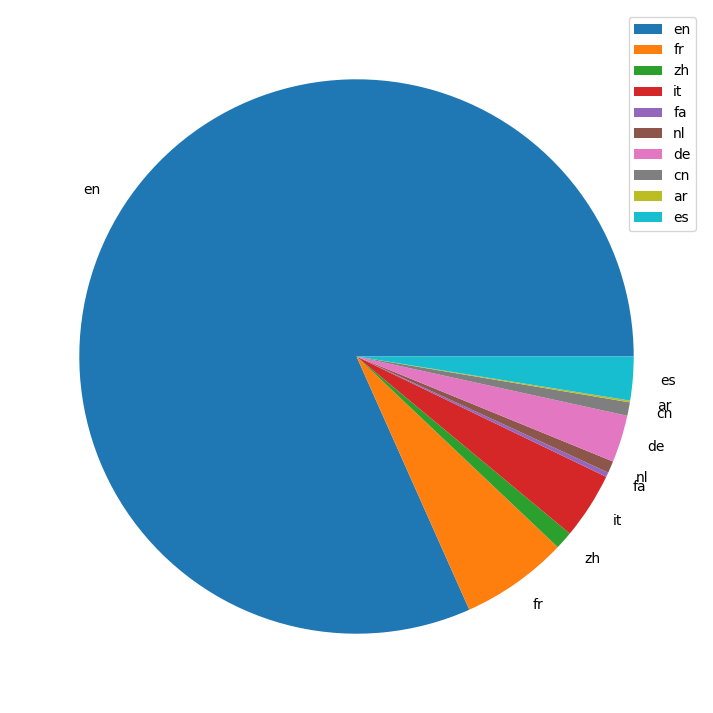

In [63]:
#plotting pie chart
plt.figure(figsize=(9,9))
plt.pie(number_of_original_languages, labels = labels_of_original_languages)
plt.legend()
plt.show()

Let's perform another EDA for production country

In [64]:
#creating a list contain all countries
thelistofcountries = []
for i in range(len(movies_df)):
  if movies_df.loc[i,'production_countries'] == "[]": #nan are equals to "[]" so we need to avoid it
    pass
  else:
    for j in movies_df.loc[i,'production_countries']:
      if ',' in j: #for movies with multiple countries as producter
        for k in range(len(movies_df.loc[i,'production_countries'].split(", "))):
          thelistofcountries.append((movies_df.loc[i,'production_countries'].split(", "))[k])
      else: #for movies with single country as producter
        thelistofcountries.append(movies_df.loc[i,'production_countries'])
setofallcountries = set(thelistofcountries) #converting to set so we avoid duplicated
listofcountries = list(setofallcountries) #converting again to a list
strlistofcountries = ""
for i in range(len(listofcountries)):
  strlistofcountries += listofcountries[i]
  strlistofcountries += ", "
strlistofcountries = strlistofcountries[:-1]
listofcountries2 = []
for i in range(len(strlistofcountries.split(", "))):
  listofcountries2.append(strlistofcountries.split(", ")[i])
setofcountries2 = set(listofcountries2)
listofcountries3 = list(setofcountries2)

In [65]:
print(len(listofcountries3))
listofcountries3

161


['Colombia',
 'Yugoslavia',
 'East Germany',
 'Iraq',
 'Samoa',
 'Tajikistan',
 'Uganda',
 'Bosnia and Herzegovina',
 'Senegal',
 'Saudi Arabia',
 'Indonesia',
 'Bermuda',
 'Cuba',
 'Sri Lanka',
 'El Salvador',
 'United States Minor Outlying Islands',
 'Ireland',
 'Slovakia',
 'Panama',
 'Thailand',
 'Aruba',
 'Israel',
 'Netherlands',
 'Rwanda',
 'Zimbabwe',
 'France',
 'Portugal',
 'Tunisia',
 'Jordan',
 'Iran',
 'Venezuela',
 'Liechtenstein',
 'Egypt',
 'Dominican Republic',
 'French Southern Territories',
 'Croatia',
 'Nepal',
 "Cote D'Ivoire",
 'Angola',
 'Georgia',
 'Spain',
 'Bulgaria',
 'Tanzania',
 'Peru',
 'Papua New Guinea',
 'South Africa',
 'Bolivia',
 'Uruguay',
 'Morocco',
 'Barbados',
 'Bahamas',
 'Nicaragua',
 'Italy',
 'Myanmar',
 'Armenia',
 'Czech Republic',
 'Palestinian Territory',
 'French Polynesia',
 'Serbia',
 'Belarus',
 'Jamaica',
 'Moldova',
 'Serbia and Montenegro',
 'Iceland',
 'Soviet Union',
 'Macao',
 'Chad',
 'Australia',
 'Luxembourg',
 'Argentina',


Now we colorize countries where there is a movie from them on this dataset

In [66]:
#importing geopandas to make a better visualization
import geopandas as gpd
df_world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


<ipython-input-66-891a588ce7c3>:3: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  df_world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


In [67]:
#counting number of movies for each country
df_world_movies = df_world
df_world_movies['Movie Count'] = 0

for i in range(len(df_world_movies)):
  for j in range(len(movies_df)): #we need to check all countries in main dataset exsist in df_world
    if df_world_movies.loc[i, 'name'] in movies_df.loc[j, 'production_countries']:
      df_world_movies.loc[i, 'Movie Count'] += 1
    else:
      pass

df_world_movies.head(10)

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,Movie Count
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",2
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",0
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",1795
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",21484
5,18513930.0,Asia,Kazakhstan,KAZ,181665,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",23
6,33580650.0,Asia,Uzbekistan,UZB,57921,"POLYGON ((55.96819 41.30864, 55.92892 44.99586...",6
7,8776109.0,Oceania,Papua New Guinea,PNG,24829,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ...",2
8,270625568.0,Asia,Indonesia,IDN,1119190,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ...",33
9,44938712.0,South America,Argentina,ARG,445445,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25000...",266


<ipython-input-68-34317fed54c7>:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


Text(0.5, 1.0, 'Number of Movies per country')

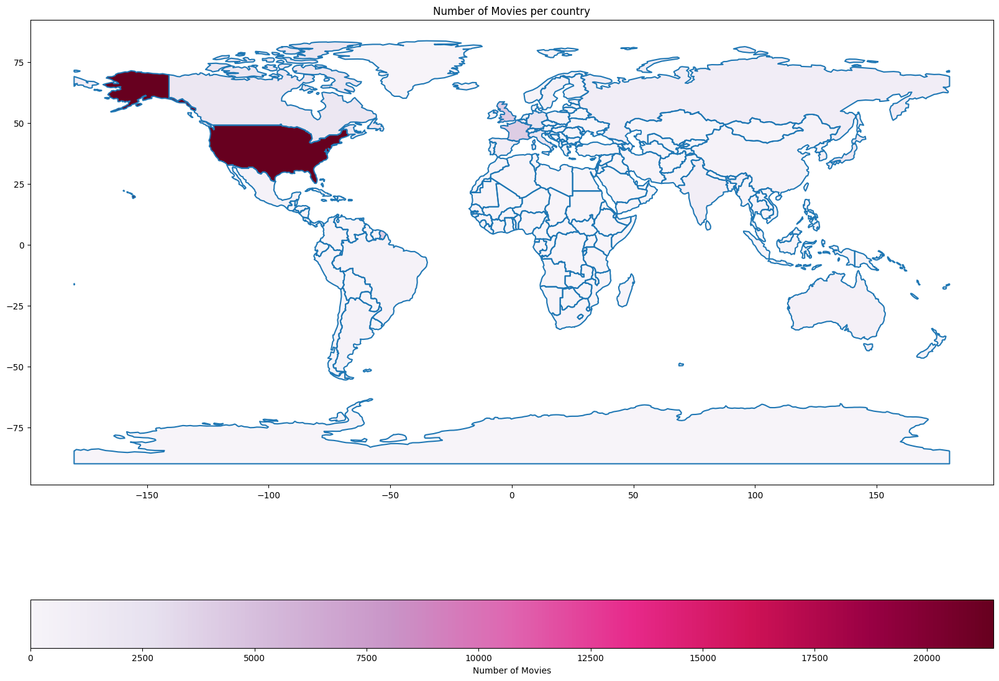

In [68]:
#visualizing result on world map
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = df_world["geometry"].boundary.plot(figsize=(20,16))
df_world_movies.plot( column="Movie Count", ax=ax, cmap='PuRd',
                     legend=True, legend_kwds={"label": "Number of Movies", "orientation":"horizontal"})
ax.set_title("Number of Movies per country")

Since lot's of movies are made by United States so we calculate once again for rest of world

In [69]:
#dropping US row
df_world_movies_except_US = df_world_movies.drop([4])
df_world_movies_except_US.head(10)

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,Movie Count
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",2
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",0
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",1795
5,18513930.0,Asia,Kazakhstan,KAZ,181665,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",23
6,33580650.0,Asia,Uzbekistan,UZB,57921,"POLYGON ((55.96819 41.30864, 55.92892 44.99586...",6
7,8776109.0,Oceania,Papua New Guinea,PNG,24829,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ...",2
8,270625568.0,Asia,Indonesia,IDN,1119190,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ...",33
9,44938712.0,South America,Argentina,ARG,445445,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25000...",266
10,18952038.0,South America,Chile,CHL,282318,"MULTIPOLYGON (((-68.63401 -52.63637, -68.63335...",70


Text(0.5, 1.0, 'Number of Movies per country Except United States')

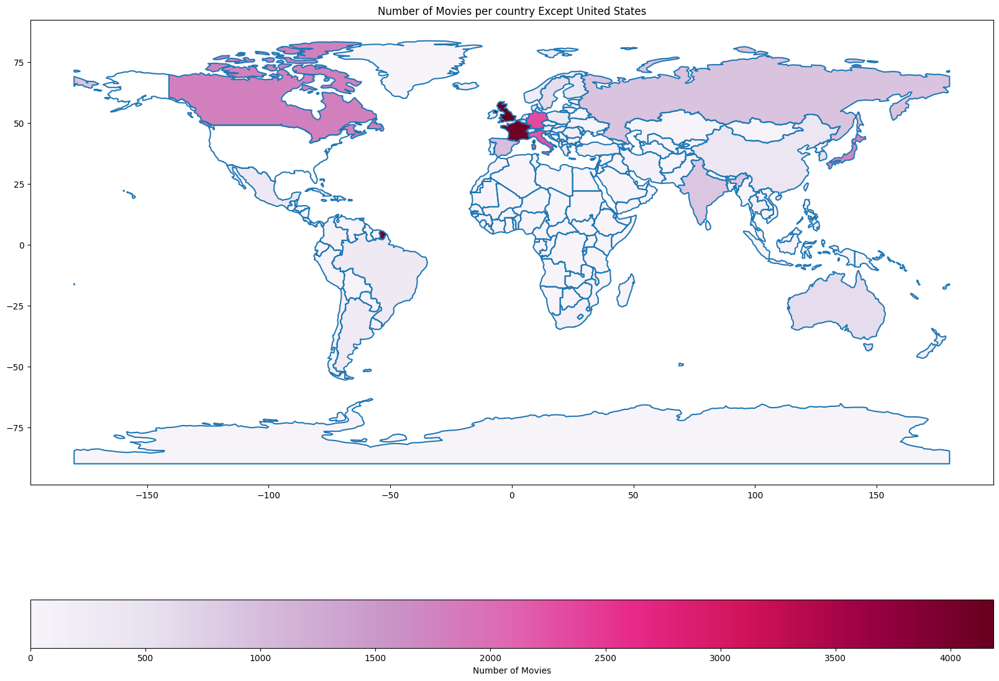

In [70]:
ax = df_world["geometry"].boundary.plot(figsize=(20,16))
df_world_movies_except_US.plot( column="Movie Count", ax=ax, cmap='PuRd',
                     legend=True, legend_kwds={"label": "Number of Movies", "orientation":"horizontal"})
ax.set_title("Number of Movies per country Except United States")

Showing distribution for top 10 producer countries

In [71]:
#sorting df_world_movies so we can take what we need eaasier
#picking top countries
df_top_countries = df_world_movies.sort_values('Movie Count', ascending=False)[:9] #picking top 10 rows according to 'Movie Count'
df_top_countries = df_top_countries.reset_index(drop=True) #reset index in order to avoid errors for further steps
df_top_countries.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,Movie Count
0,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",21484
1,66834405.0,Europe,United Kingdom,GBR,2829108,"MULTIPOLYGON (((-6.19788 53.86757, -6.95373 54...",4186
2,67059887.0,Europe,France,FRA,2715518,"MULTIPOLYGON (((-51.65780 4.15623, -52.24934 3...",4079
3,83132799.0,Europe,Germany,DEU,3861123,"POLYGON ((14.11969 53.75703, 14.35332 53.24817...",2330
4,60297396.0,Europe,Italy,ITA,2003576,"MULTIPOLYGON (((10.44270 46.89355, 11.04856 46...",2240


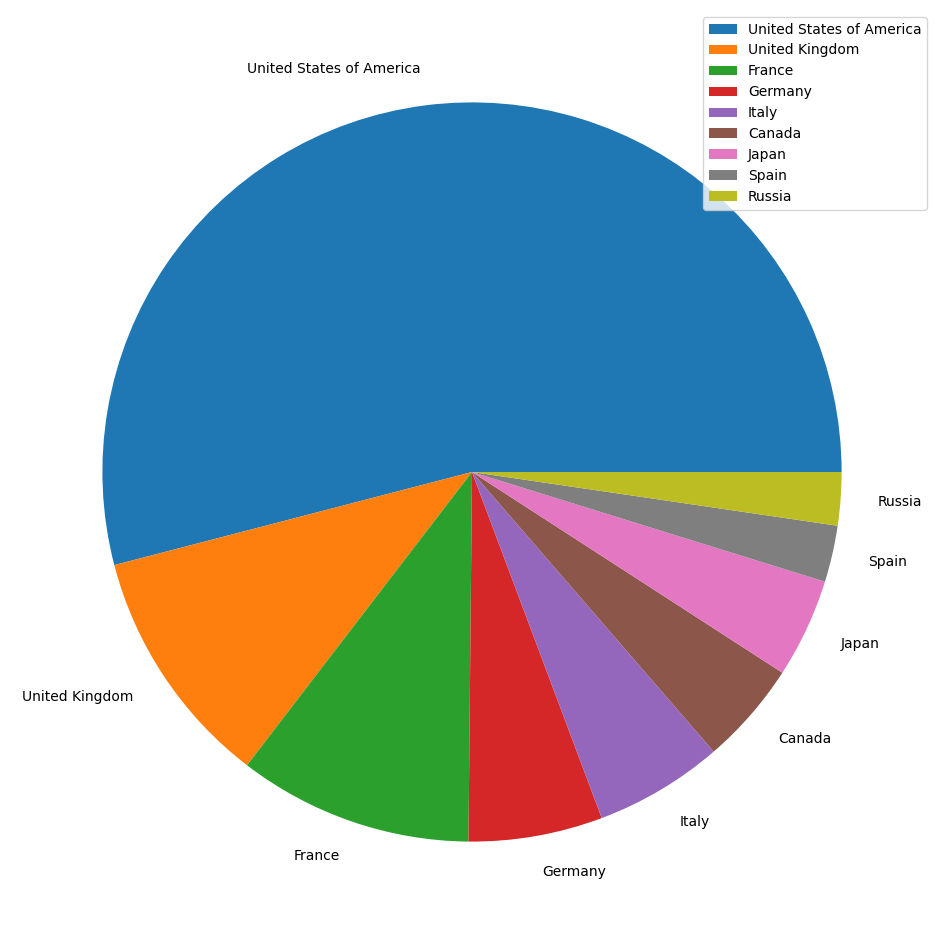

In [72]:
number_of_movies_according_to_countries = list(df_top_countries['Movie Count'])
labels_of_movies_according_to_countries = list(df_top_countries['name'])
#plotting pie chart
plt.figure(figsize=(12,12))
plt.pie(number_of_movies_according_to_countries, labels = labels_of_movies_according_to_countries)
plt.legend()
plt.show()

Performing EDA for genres

In [73]:
#creating a list contain all genres
thelistofgenres = [] #first creating a list to put all genres
for i in range(len(movies_df)):
  if movies_df.loc[i,'genres'] == "[]": #in case of missing value
    pass
  else:
    for j in movies_df.loc[i,'genres']: #in case of dealing with movies with multiple genres
      if ',' in j:
        for k in range(len(movies_df.loc[i,'genres'].split(", "))):
          thelistofgenres.append((movies_df.loc[i,'genres'].split(", "))[k])
      else:
        thelistofgenres.append(movies_df.loc[i,'genres'])
setofallgenres = set(thelistofgenres) #converting to set so additionals will be deleted
listofgenres = list(setofallgenres) #converting to list again so we have a list of all genres
strlistofgenres = "" #making a str to stick all genres together
for i in range(len(listofgenres)):
  strlistofgenres += listofgenres[i]
  strlistofgenres += ", " #allow us to distinct between genres at next steps
strlistofgenres = strlistofgenres[:-2]
listofgenres2 = []
for i in range(len(strlistofgenres.split(", "))):
  listofgenres2.append(strlistofgenres.split(", ")[i])
setofgenres2 = set(listofgenres2)
listofgenres3 = list(setofgenres2)

In [74]:
print(len(listofgenres3))
listofgenres3

20


['Documentary',
 'TV Movie',
 'War',
 'History',
 'Fantasy',
 'Crime',
 'Science Fiction',
 'Horror',
 'Foreign',
 'Drama',
 'Animation',
 'Music',
 'Comedy',
 'Romance',
 'Thriller',
 'Family',
 'Western',
 'Action',
 'Mystery',
 'Adventure']

Creating a new dataframe to count number of movies in each genre

In [75]:
#defining dataframe with 2 columns and number of rows equal to number of genres
df_genres = pd.DataFrame(index=np.arange(len(listofgenres3)), columns=('Genre', 'Movie Count'))
df_genres['Movie Count'] = 0

#adding list of genres to dataframe
for i in range(len(listofgenres3)):
  df_genres.loc[i,'Genre'] = listofgenres3[i]

#counting number of movies in each genre
for i in range(len(df_genres)):
  for j in range(len(movies_df)):
    if df_genres.loc[i, 'Genre'] in movies_df.loc[j, 'genres']:
      df_genres.loc[i, 'Movie Count'] += 1
    else:
      pass


In [76]:
df_genres.head()

,Genre,Movie Count
0,Documentary,4050
1,TV Movie,791
2,War,1348
3,History,1427
4,Fantasy,2385


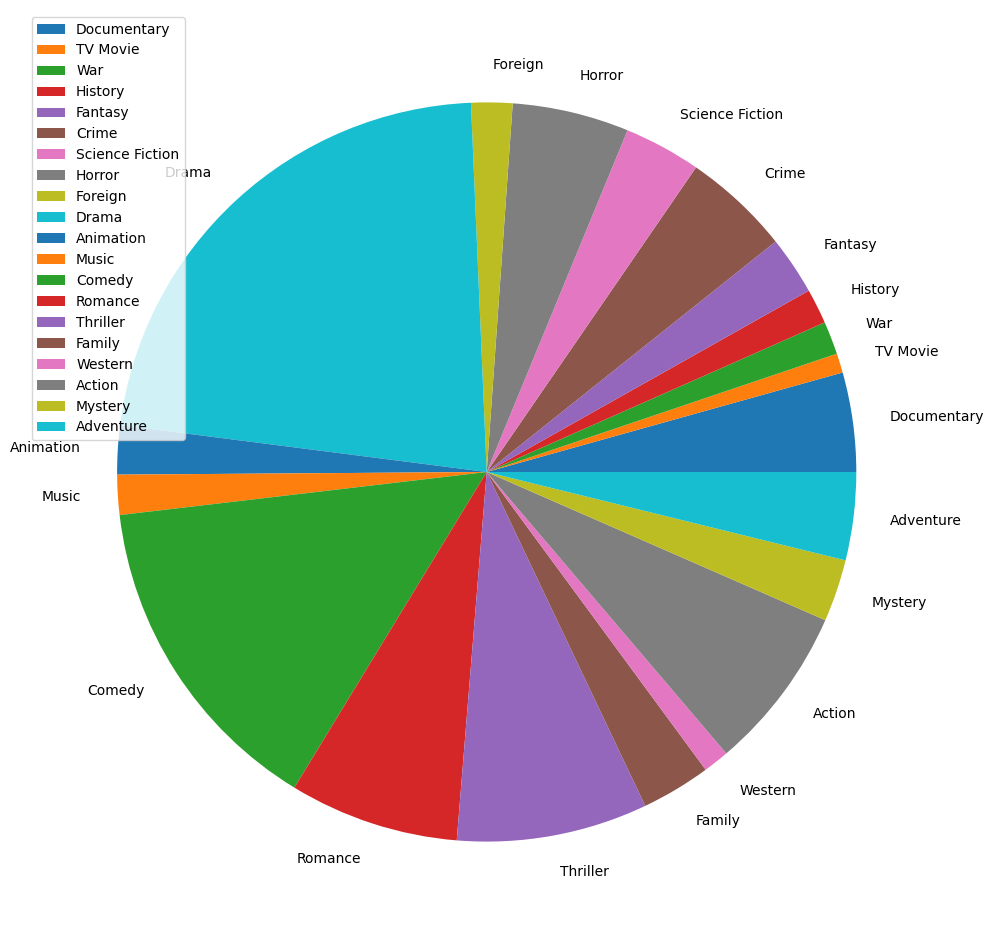

In [77]:
number_of_genres = list(df_genres['Movie Count'])
labels_of_genres = list(df_genres['Genre'])
#plotting pie chart
plt.figure(figsize=(12,12))
plt.pie(number_of_genres, labels = labels_of_genres)
plt.legend()
plt.show()

Performing EDA for runtime<br>
At this step we first categorized runtime and make a new column called 'Length'<br>
At this column we categorized runtimes according to this:<br>
1) 1-60mins => short<br>
2) 60-120mins => medium<br>
3) 120-180mins => almost long<br>
4) 180-240min => long<br>
5) over 240mins => very long

In [78]:
for i in range(len(movies_df)):
  if pd.isnull(movies_df.loc[i, 'runtime']):#for nan we put 'No intel'
    movies_df.loc[i, 'Length'] = 'No intel'
  elif int(movies_df.loc[i, 'runtime']) > 0 and int(movies_df.loc[i, 'runtime']) <= 60:
    movies_df.loc[i, 'Length'] = 'short'
  elif int(movies_df.loc[i, 'runtime']) > 60 and int(movies_df.loc[i, 'runtime']) <= 120:
    movies_df.loc[i, 'Length'] = 'medium'
  elif int(movies_df.loc[i, 'runtime']) > 120 and int(movies_df.loc[i, 'runtime']) <= 180:
    movies_df.loc[i, 'Length'] = 'almost long'
  elif int(movies_df.loc[i, 'runtime']) > 180 and int(movies_df.loc[i, 'runtime']) <= 240:
    movies_df.loc[i, 'Length'] = 'long'
  elif int(movies_df.loc[i, 'runtime']) > 240:
    movies_df.loc[i, 'Length'] = 'very long'
  else:#this is for specail case where we may have 0 as runtime
    movies_df.loc[i, 'Length'] = 'No intel'

#checking new column
movies_df['Length'].head(10)

0         medium
1         medium
2         medium
3    almost long
4         medium
5    almost long
6    almost long
7         medium
8         medium
9    almost long
Name: Length, dtype: object

In [79]:
#defining dataframe with 2 columns and number of rows equal to number of 'Length' categories
df_Length = pd.DataFrame(index=np.arange(len(list(movies_df['Length'].unique()))), columns=('Length', 'Movie Count'))
df_Length['Movie Count'] = 0

#adding list of Length to dataframe
for i in range(len(list(movies_df['Length'].unique()))):
  df_Length.loc[i,'Length'] = list(movies_df['Length'].unique())[i]

#counting number of movies in each Length
for i in range(len(df_Length)):
  for j in range(len(movies_df)):
    if df_Length.loc[i, 'Length'] in movies_df.loc[j, 'Length']:
      df_Length.loc[i, 'Movie Count'] += 1
    else:
      pass


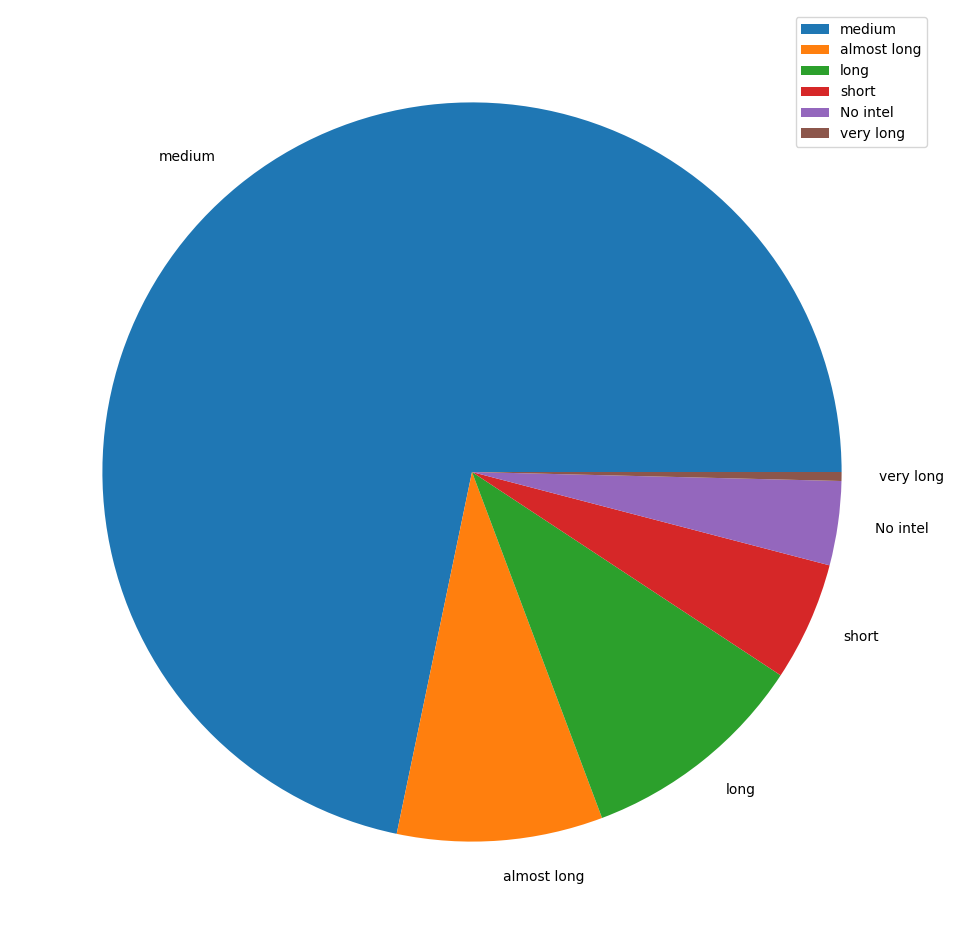

In [80]:
number_of_each_length = list(df_Length['Movie Count'])
labels_of_Length = list(df_Length['Length'])
#plotting pie chart
plt.figure(figsize=(12,12))
plt.pie(number_of_each_length, labels = labels_of_Length)
plt.legend()
plt.show()

Performing EDA for average vote and count vote<br>
for this we create two columns called average_vote_categorized and count_vote_categorized<br>
average_vote_categorized contain 10 categorie 0-1, 1-2, 2-3,...,9-10 and count_vote_categorized contain 5 categories 0-10, 10-20, 20-30, 30-40, 40-50, 50-100 and over 100

In [81]:
#creating a column for average vote categorized
for i in range(len(movies_df)):
  if movies_df.loc[i, 'vote_average'] <= 1:
    movies_df.loc[i, 'average_vote_categorized'] = "0-1"
  elif movies_df.loc[i, 'vote_average'] <= 2:
    movies_df.loc[i, 'average_vote_categorized'] = "1-2"
  elif movies_df.loc[i, 'vote_average'] <= 3:
    movies_df.loc[i, 'average_vote_categorized'] = "2-3"
  elif movies_df.loc[i, 'vote_average'] <= 4:
    movies_df.loc[i, 'average_vote_categorized'] = "3-4"
  elif movies_df.loc[i, 'vote_average'] <= 5:
    movies_df.loc[i, 'average_vote_categorized'] = "4-5"
  elif movies_df.loc[i, 'vote_average'] <= 6:
    movies_df.loc[i, 'average_vote_categorized'] = "5-6"
  elif movies_df.loc[i, 'vote_average'] <= 7:
    movies_df.loc[i, 'average_vote_categorized'] = "6-7"
  elif movies_df.loc[i, 'vote_average'] <= 8:
    movies_df.loc[i, 'average_vote_categorized'] = "7-8"
  elif movies_df.loc[i, 'vote_average'] <= 9:
    movies_df.loc[i, 'average_vote_categorized'] = "8-9"
  elif movies_df.loc[i, 'vote_average'] <= 10:
    movies_df.loc[i, 'average_vote_categorized'] = "9-10"
  else:
    movies_df.loc[i, 'average_vote_categorized'] = "" #in case of confronting with unusual values

#creating a column for vote count categorized
for i in range(len(movies_df)):
  if movies_df.loc[i, 'vote_count'] <= 10:
    movies_df.loc[i, 'count_vote_categorized'] = "0-10"
  elif movies_df.loc[i, 'vote_count'] <= 20:
    movies_df.loc[i, 'count_vote_categorized'] = "10-20"
  elif movies_df.loc[i, 'vote_count'] <= 30:
    movies_df.loc[i, 'count_vote_categorized'] = "20-30"
  elif movies_df.loc[i, 'vote_count'] <= 40:
    movies_df.loc[i, 'count_vote_categorized'] = "30-40"
  elif movies_df.loc[i, 'vote_count'] <= 50:
    movies_df.loc[i, 'count_vote_categorized'] = "40-50"
  elif movies_df.loc[i, 'vote_count'] <= 100:
    movies_df.loc[i, 'count_vote_categorized'] = "50-100"
  elif movies_df.loc[i, 'vote_count'] > 100:
    movies_df.loc[i, 'count_vote_categorized'] = "over 100"
  else:
    movies_df.loc[i, 'count_vote_categorized'] = "" #in case of confronting with unusual values

movies_df.head(3)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100
2,False,Grumpy Old Men Collection,0.0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"fishing, best friend, duringcreditsstinger, ol...",Howard Deutch,Mark Steven Johnson,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",budget unlnown,medium,6-7,50-100


Time to visualize distribution at new column('budget_categorized')

In [82]:
list_average_vote_categorized = list(movies_df['average_vote_categorized'].unique())
list_count_vote_categorized = list(movies_df['count_vote_categorized'].unique())

In [83]:
#creating a pie chart to visualize average vote categorized
number_of_average_vote_categorized = []
labels_of_average_vote_categorized = []

for i in range(len(list_average_vote_categorized)):
  labels_of_average_vote_categorized.append(list_average_vote_categorized[i])
  number_of_average_vote_categorized.append(movies_df['average_vote_categorized'].value_counts()[list_average_vote_categorized[i]])


#creating a pie chart to visualize count vote categorized
number_of_count_vote_categorized = []
labels_of_count_vote_categorized = []

for i in range(len(list_count_vote_categorized)):
  labels_of_count_vote_categorized.append(list_count_vote_categorized[i])
  number_of_count_vote_categorized.append(movies_df['count_vote_categorized'].value_counts()[list_count_vote_categorized[i]])

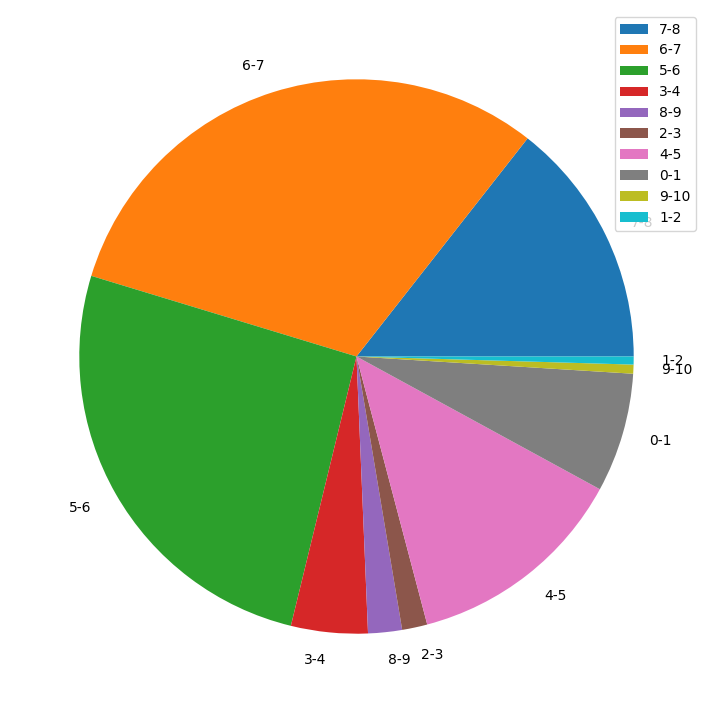

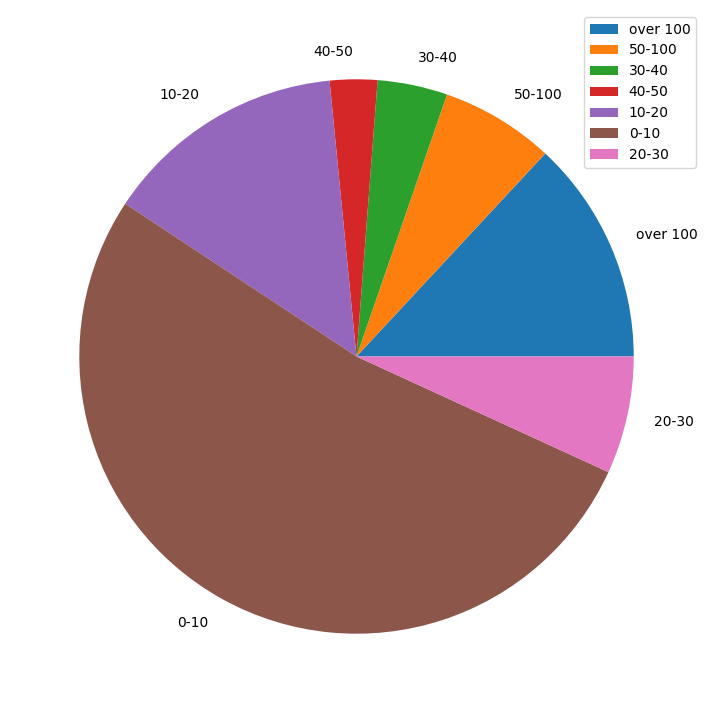

In [84]:
#plotting pie chart average vote categorized
plt.figure(figsize=(9,9))
plt.pie(number_of_average_vote_categorized, labels = labels_of_average_vote_categorized)
plt.legend()
plt.show()
#plotting pie chart count vote categorized
plt.figure(figsize=(9,9))
plt.pie(number_of_count_vote_categorized, labels = labels_of_count_vote_categorized)
plt.legend()
plt.show()

## Part A: Popular based approaches

There are two approaches we can use to choose top movies for popular based recommendation<br>
1- Using popularity which is an index computed according to number of votes at day, number of views at day, number of add to favorite marks at day, number of add to watchlist at day, number of total votes, release date, previous day score<br>
2- Using weighted rating which is an index computed according to average votes and number of all votes.

we define a new dataframe based on main data frame and we call it df_popular, the reason we do this is because we made some changes on dataset like sorting according to a specific feature

In [85]:
df_popular = movies_df

In [86]:
#checking dataframe again
df_popular.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100
2,False,Grumpy Old Men Collection,0.0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"fishing, best friend, duringcreditsstinger, ol...",Howard Deutch,Mark Steven Johnson,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",budget unlnown,medium,6-7,50-100
3,False,NaN,16000000.0,"Comedy, Drama, Romance",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,English,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"based on novel, interracial relationship, sing...",Forest Whitaker,,"Whitney Houston, Angela Bassett, Loretta Devin...",15-20m,almost long,6-7,30-40
4,False,Father of the Bride Collection,0.0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"Sandollar Productions, Touchstone Pictures",United States of America,1995-02-10,76578911.0,106.0,English,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"baby, midlife crisis, confidence, aging, daugh...",Charles Shyer,,"Steve Martin, Diane Keaton, Martin Short, Kimb...",budget unlnown,medium,5-6,over 100


**Recommending Based on Popularity**

In [87]:
df_popular_popularity = df_popular.sort_values('popularity', ascending=False) #sorting data rows according to popularity
df_popular_popularity = df_popular_popularity.reset_index(drop=True) #reset index in order to avoid errors for further steps

In [88]:
df_popular_popularity.head(5)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized
0,False,Despicable Me Collection,74000000.0,"Family, Animation, Adventure, Comedy",http://www.minionsmovie.com/,211672,tt2293640,en,Minions,"Minions Stuart, Kevin and Bob are recruited by...",547.488298,/q0R4crx2SehcEEQEkYObktdeFy.jpg,"Universal Pictures, Illumination Entertainment",United States of America,2015-06-17,1.156731e+09,91.0,English,Released,"Before Gru, they had a history of bad bosses",Minions,False,6.4,4729.0,"assistant, aftercreditsstinger, duringcreditss...","Kyle Balda, Pierre Coffin",Brian Lynch,"Sandra Bullock, Jon Hamm, Michael Keaton, Alli...",50-75m,medium,6-7,over 100
1,False,Wonder Woman Collection,149000000.0,"Action, Adventure, Fantasy",http://www.warnerbros.com/wonder-woman,297762,tt0451279,en,Wonder Woman,An Amazon princess comes to the world of Man t...,294.337037,/imekS7f1OuHyUP2LAiTEM0zBzUz.jpg,"Dune Entertainment, Atlas Entertainment, Warne...",United States of America,2017-05-30,8.205804e+08,141.0,"Deutsch, English",Released,Power. Grace. Wisdom. Wonder.,Wonder Woman,False,7.2,5025.0,"dc comics, hero, greek mythology, island, worl...",Patty Jenkins,Geoff Johns,"Gal Gadot, Chris Pine, Robin Wright, Danny Hus...",100-150m,almost long,7-8,over 100
2,False,NaN,160000000.0,"Family, Fantasy, Romance",http://movies.disney.com/beauty-and-the-beast-...,321612,tt2771200,en,Beauty and the Beast,A live-action adaptation of Disney's version o...,287.253654,/tWqifoYuwLETmmasnGHO7xBjEtt.jpg,"Walt Disney Pictures, Mandeville Films","United Kingdom, United States of America",2017-03-16,1.262886e+09,129.0,English,Released,Be our guest.,Beauty and the Beast,False,6.8,5530.0,"france, magic, castle, fairy tale, musical, cu...",Bill Condon,,"Emma Watson, Dan Stevens, Luke Evans, Kevin Kl...",150-200m,almost long,6-7,over 100
3,False,NaN,34000000.0,"Action, Crime",NaN,339403,tt3890160,en,Baby Driver,After being coerced into working for a crime b...,228.032744,/dN9LbVNNZFITwfaRjl4tmwGWkRg.jpg,"Big Talk Productions, TriStar Pictures, Media ...","United Kingdom, United States of America",2017-06-28,2.245113e+08,113.0,English,Released,All you need is one killer track.,Baby Driver,False,7.2,2083.0,"robbery, atlanta, music, crime boss, romance, ...",Edgar Wright,Edgar Wright,"Ansel Elgort, Lily James, Kevin Spacey, Jamie ...",30-40m,medium,7-8,over 100
4,False,NaN,165000000.0,"Adventure, Family, Animation, Action, Comedy",http://movies.disney.com/big-hero-6,177572,tt2245084,en,Big Hero 6,The special bond that develops between plus-si...,213.849907,/9gLu47Zw5ertuFTZaxXOvNfy78T.jpg,"Walt Disney Pictures, Walt Disney Animation St...",United States of America,2014-10-24,6.521054e+08,102.0,English,Released,From the creators of Wreck-it Ralph and Frozen,Big Hero 6,False,7.8,6289.0,"brother brother relationship, hero, talent, re...","Chris Williams, Don Hall",,"Scott Adsit, Ryan Potter, Daniel Henney, T.J. ...",150-200m,medium,7-8,over 100


Exporting to a csv file so later we can use this

In [89]:
df_popular_popularity.to_csv(r'/content/the-movies-dataset/df_popular_popularity.csv', index=False, header=True)


In [90]:
def popular_based_recommendation_popularity(number_of_recommendation):
  for i in range(number_of_recommendation):
    print("RECOMMENDATION #{}".format(i+1))
    print("popularity index: {:.2f}".format(df_popular_popularity.loc[i, 'popularity']))
    if df_popular_popularity.loc[i, 'original_title'] == df_popular_popularity.loc[i, 'title']: #for some foreign movies will print english title inside parentheses
      print("Movie Name : {}".format(df_popular_popularity.loc[i, 'original_title']))
    else:
      print("Movie Name : {}({})".format(df_popular_popularity.loc[i, 'original_title'],df_popular_popularity.loc[i, 'title']))
    print("Average Vote: {}/10".format(df_popular_popularity.loc[i, 'vote_average']))
    if pd.isnull(df_popular_popularity.loc[i, 'overview']): #will not print this if we have no info about overview
      pass
    else:
      print("Release date: {}".format(df_popular_popularity.loc[i, 'release_date'].date()))
    if pd.isnull(df_popular_popularity.loc[i, 'runtime']):
      pass
    else:
      print("length: {} minutes".format(int(df_popular_popularity.loc[i, 'runtime'])))
    print("Genres: {}".format(df_popular_popularity.loc[i, 'genres']))
    if pd.isnull(df_popular_popularity.loc[i, 'revenue']):
      pass
    else:
      if int(df_popular_popularity.loc[i, 'revenue'])/1000000000 > 1:
        print("Revenue: {:.3f} billion USD".format(int(df_popular_popularity.loc[i, 'revenue'])/1000000000))
      else:
        print("Revenue: {} million USD".format(int(int(df_popular_popularity.loc[i, 'revenue'])/1000000)))
    if pd.isnull(df_popular_popularity.loc[i, 'original_language']):
      pass
    else:
      print("Language: {}".format(df_popular_popularity.loc[i, 'original_language']))
    if pd.isnull(df_popular_popularity.loc[i, 'overview']):
      pass
    else:
      print("Overview: {}".format(df_popular_popularity.loc[i, 'overview']))
    if df_popular_popularity.loc[i, 'Director'] == "[]": #if we have no info of value is "[]" will not print this
      pass
    elif df_popular_popularity.loc[i, 'Director'] == "":
      pass
    else:
      print("Directed By: {}".format(df_popular_popularity.loc[i, 'Director']))
    if df_popular_popularity.loc[i, 'Writer'] == "[]":
      pass
    elif df_popular_popularity.loc[i, 'Writer'] == "":
      pass
    else:
      print("Writen By: {}".format(df_popular_popularity.loc[i, 'Writer']))
    if df_popular_popularity.loc[i, 'Cast'] == "[]":
      pass
    elif df_popular_popularity.loc[i, 'Cast'] == "":
      pass
    else:
      print("Cast: {}".format(df_popular_popularity.loc[i, 'Cast']))
    if df_popular_popularity.loc[i, 'production_companies'] == "[]":
      pass
    elif df_popular_popularity.loc[i, 'production_companies'] == "":
      pass
    else:
      print("Production Company(es): {}".format(df_popular_popularity.loc[i, 'production_companies']))
    if df_popular_popularity.loc[i, 'production_countries'] == "[]":
      pass
    elif df_popular_popularity.loc[i, 'production_countries'] == "":
      pass
    else:
      print("Production Country(es): {}".format(df_popular_popularity.loc[i, 'production_countries']))
    if pd.isnull(df_popular_popularity.loc[i, 'imdb_id']):
      pass
    else:
      print("IMDB web page : https://www.imdb.com/title/{}".format(df_popular_popularity.loc[i, 'imdb_id']))
    if pd.isnull(df_popular_popularity.loc[i, 'homepage']):
      pass
    else:
      print("Movie Webpage: {}".format(df_popular_popularity.loc[i, 'homepage']))
    print("\n \n \n")


Let's check with 5 recommendation

In [91]:
popular_based_recommendation_popularity(5)

RECOMMENDATION #1
popularity index: 547.49
Movie Name : Minions
Average Vote: 6.4/10
Release date: 2015-06-17
length: 91 minutes
Genres: Family, Animation, Adventure, Comedy
Revenue: 1.157 billion USD
Language: en
Overview: Minions Stuart, Kevin and Bob are recruited by Scarlet Overkill, a super-villain who, alongside her inventor husband Herb, hatches a plot to take over the world.
Directed By: Kyle Balda, Pierre Coffin
Writen By: Brian Lynch
Cast: Sandra Bullock, Jon Hamm, Michael Keaton, Allison Janney, Steve Coogan, Jennifer Saunders, Geoffrey Rush, Steve Carell, Pierre Coffin, Katy Mixon, Michael Beattie, Hiroyuki Sanada, Dave Rosenbaum, Alex Dowding, Paul Thornley, Kyle Balda, Ava Acres
Production Company(es): Universal Pictures, Illumination Entertainment
Production Country(es): United States of America
IMDB web page : https://www.imdb.com/title/tt2293640
Movie Webpage: http://www.minionsmovie.com/

 
 

RECOMMENDATION #2
popularity index: 294.34
Movie Name : Wonder Woman
Averag

**Recommending Based on Weight Rating**

In [92]:
df_popular_WR = df_popular

At this method we calculate weight rating for each which computed by average vote score and total number of votes for each movie.<br>
here's formula:
$$ Weighted Rating = \frac{v}{v+m}R+\frac{m}{v+m}C $$
where v is the number of votes for the movie<br>
m is the minimum votes required to be listed in the chart<br>
R is the average rating of the movie<br>
C is the mean vote across the whole report

In [93]:
#calculating C
v = df_popular_WR['vote_count']
R = df_popular_WR['vote_average']
C = df_popular_WR['vote_average'].mean()

<Axes: xlabel='vote_count', ylabel='Density'>

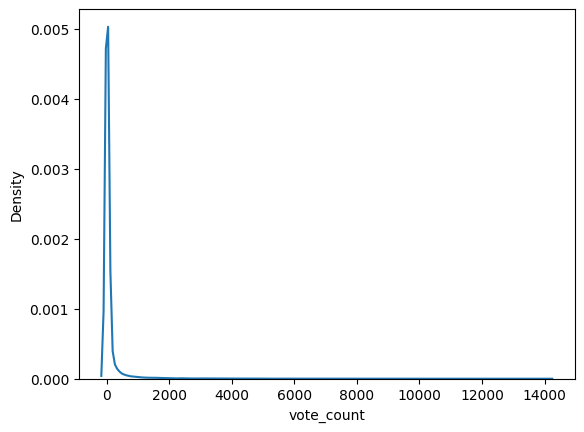

In [94]:
#in order to plot figures
import seaborn as sns

#plotting a density figure to check number of vote count for each movie
sns.kdeplot(df_popular_WR['vote_count'])

<Axes: xlabel='vote_average', ylabel='Density'>

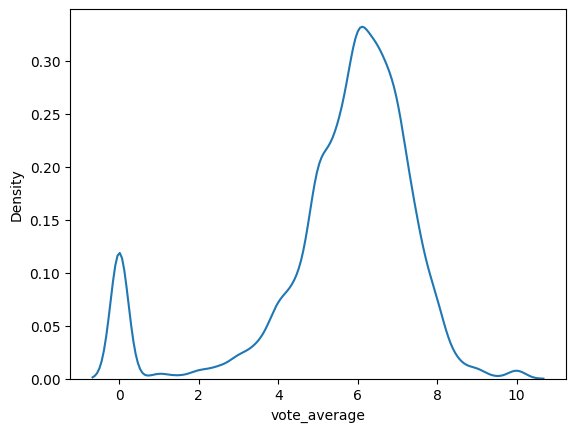

In [95]:
#plotting a density figure to check average vote score for each movie
sns.kdeplot(df_popular_WR['vote_average'])

we set minimum number of votes to 100

In [96]:
m = 100

In [97]:
# Filter out all qualified movies into a new DataFrame
df_popular_WR_Q = df_popular_WR.copy().loc[df_popular_WR['vote_count'] >= m]
df_popular_WR_Q.shape

(6132, 32)

We add a new column called Weight_Rating which represent score according to mentioned formula

In [98]:
v = df_popular_WR_Q['vote_count']
R = df_popular_WR_Q['vote_average']
C = df_popular_WR_Q['vote_average'].mean()

In [99]:
df_popular_WR_Q['Weight_Rating'] = ((v/(v+m))*R) + ((m/(v+m))*C)


In [100]:
df_popular_WR_Q.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized,Weight_Rating
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100,7.676840
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100,6.881007
4,False,Father of the Bride Collection,0.0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"Sandollar Productions, Touchstone Pictures",United States of America,1995-02-10,76578911.0,106.0,English,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"baby, midlife crisis, confidence, aging, daugh...",Charles Shyer,,"Steve Martin, Diane Keaton, Martin Short, Kimb...",budget unlnown,medium,5-6,over 100,5.964731
5,False,NaN,60000000.0,"Action, Crime, Drama, Thriller",NaN,949,tt0113277,en,Heat,"Obsessive master thief, Neil McCauley leads a ...",17.924927,/zMyfPUelumio3tiDKPffaUpsQTD.jpg,"Regency Enterprises, Forward Pass, Warner Bros.",United States of America,1995-12-15,187436818.0,170.0,"English, Español",Released,A Los Angeles Crime Saga,Heat,False,7.7,1886.0,"robbery, detective, bank, obsession, chase, sh...",Michael Mann,,"Al Pacino, Robert De Niro, Val Kilmer, Jon Voi...",50-75m,almost long,7-8,over 100,7.635686
6,False,NaN,58000000.0,"Comedy, Romance",NaN,11860,tt0114319,en,Sabrina,An ugly duckling having undergone a remarkable...,6.677277,/jQh15y5YB7bWz1NtffNZmRw0s9D.jpg,"Paramount Pictures, Scott Rudin Productions, M...","Germany, United States of America",1995-12-15,0.0,127.0,"Français, English",Released,You are cordially invited to the most surprisi...,Sabrina,False,6.2,141.0,"paris, brother brother relationship, chauffeur...",Sydney Pollack,,"Harrison Ford, Julia Ormond, Greg Kinnear, Ang...",50-75m,almost long,6-7,over 100,6.292414


In [101]:
df_popular_WR_Q = df_popular_WR_Q.sort_values('Weight_Rating', ascending=False) #sorting data rows according to popularity
df_popular_WR_Q = df_popular_WR_Q.reset_index(drop=True) #reset index in order to avoid errors for further steps

In [102]:
df_popular_WR_Q.to_csv(r'/content/the-movies-dataset/df_popular_WR_Q.csv', index=False, header=True)


In [103]:
#defining a function for Weighted Rating Method
def popular_based_recommendation_WR(number_of_recommendation):
  for i in range(number_of_recommendation):
    print("RECOMMENDATION #{}".format(i+1))
    print("Weight Rating index: {:.2f}".format(df_popular_WR_Q.loc[i, 'Weight_Rating']))
    if df_popular_WR_Q.loc[i, 'original_title'] == df_popular_WR_Q.loc[i, 'title']: #for some foreign movies will print english title inside parentheses
      print("Movie Name : {}".format(df_popular_WR_Q.loc[i, 'original_title']))
    else:
      print("Movie Name : {}({})".format(df_popular_WR_Q.loc[i, 'original_title'],df_popular_WR_Q.loc[i, 'title']))
    print("Average Vote: {}/10".format(df_popular_WR_Q.loc[i, 'vote_average']))
    if pd.isnull(df_popular_WR_Q.loc[i, 'overview']): #will not print this if we have no info about overview
      pass
    else:
      print("Release date: {}".format(df_popular_WR_Q.loc[i, 'release_date'].date()))
    if pd.isnull(df_popular_WR_Q.loc[i, 'runtime']):
      pass
    else:
      print("length: {} minutes".format(int(df_popular_WR_Q.loc[i, 'runtime'])))
    print("Genres: {}".format(df_popular_WR_Q.loc[i, 'genres']))
    if pd.isnull(df_popular_WR_Q.loc[i, 'revenue']):
      pass
    else:
      if int(df_popular_WR_Q.loc[i, 'revenue'])/1000000000 > 1:
        print("Revenue: {:.3f} billion USD".format(int(df_popular_WR_Q.loc[i, 'revenue'])/1000000000))
      else:
        print("Revenue: {} million USD".format(int(int(df_popular_WR_Q.loc[i, 'revenue'])/1000000)))
    if pd.isnull(df_popular_WR_Q.loc[i, 'original_language']):
      pass
    else:
      print("Language: {}".format(df_popular_WR_Q.loc[i, 'original_language']))
    if pd.isnull(df_popular_WR_Q.loc[i, 'overview']):
      pass
    else:
      print("Overview: {}".format(df_popular_WR_Q.loc[i, 'overview']))
    if df_popular_WR_Q.loc[i, 'Director'] == "[]": #if we have no info of value is "[]" will not print this
      pass
    elif df_popular_WR_Q.loc[i, 'Director'] == "":
      pass
    else:
      print("Directed By: {}".format(df_popular_WR_Q.loc[i, 'Director']))
    if df_popular_WR_Q.loc[i, 'Writer'] == "[]":
      pass
    elif df_popular_WR_Q.loc[i, 'Writer'] == "":
      pass
    else:
      print("Writen By: {}".format(df_popular_WR_Q.loc[i, 'Writer']))
    if df_popular_WR_Q.loc[i, 'Cast'] == "[]":
      pass
    elif df_popular_WR_Q.loc[i, 'Cast'] == "":
      pass
    else:
      print("Cast: {}".format(df_popular_WR_Q.loc[i, 'Cast']))
    if df_popular_WR_Q.loc[i, 'production_companies'] == "[]":
      pass
    elif df_popular_WR_Q.loc[i, 'production_companies'] == "":
      pass
    else:
      print("Production Company(es): {}".format(df_popular_WR_Q.loc[i, 'production_companies']))
    if df_popular_WR_Q.loc[i, 'production_countries'] == "[]":
      pass
    elif df_popular_WR_Q.loc[i, 'production_countries'] == "":
      pass
    else:
      print("Production Country(es): {}".format(df_popular_WR_Q.loc[i, 'production_countries']))
    if pd.isnull(df_popular_WR_Q.loc[i, 'imdb_id']):
      pass
    else:
      print("IMDB web page : https://www.imdb.com/title/{}".format(df_popular_WR_Q.loc[i, 'imdb_id']))
    if pd.isnull(df_popular_WR_Q.loc[i, 'homepage']):
      pass
    else:
      print("Movie Webpage: {}".format(df_popular_WR_Q.loc[i, 'homepage']))
    print("\n \n \n")

In [104]:
popular_based_recommendation_WR(5)

RECOMMENDATION #1
Weight Rating index: 8.75
Movie Name : Dilwale Dulhania Le Jayenge
Average Vote: 9.1/10
Release date: 1995-10-20
length: 190 minutes
Genres: Comedy, Drama, Romance
Revenue: 100 million USD
Language: hi
Overview: Raj is a rich, carefree, happy-go-lucky second generation NRI. Simran is the daughter of Chaudhary Baldev Singh, who in spite of being an NRI is very strict about adherence to Indian values. Simran has left for India to be married to her childhood fiancé. Raj leaves for India with a mission at his hands, to claim his lady love under the noses of her whole family. Thus begins a saga.
Directed By: Aditya Chopra
Writen By: Aditya Chopra
Cast: Shah Rukh Khan, Kajol, Amrish Puri, Anupam Kher, Satish Shah, Achala Sachdev, Himani Shivpuri, Pooja Ruparel, Mandira Bedi, Uday Chopra, Parmeet Sethi, Tulika Chaudhary, Pallavi Vyas, Karan Johar, Arjun Sablok, Anaita Shroff, Baby Raashi, Baby Nupur, Shanker Iyer, Rajesh Bhatija, Govind Khatri, Mansoor Merchant, Mohit Kumar,

## Part B: Content Based Filtering Approaches

At this part we make recommendation according to two methods which I'll explain more later.<br>
At this method we recommend similar items according to attributes of query item.

For this Part we use movies_metadata cleaned dataset or movies_df but we need to remove some columns or change some columns.

In [105]:
#let's just visualize dataframe again
movies_df.head(2) #checking only two rows, the only reason is to make scroll left and right easier

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100


In [106]:
df_cbf = movies_df

for content based filtering approaches in this dataset we use these features:<br>
'adult', 'belongs_to_collection', 'genres', 'original_language', 'overview', 'production_companies', 'production_countries', 'tagline', 'title', 'keywords', 'Director', 'Writer', 'Cast', 'budget_categorized', 'Length'<br>
but we don't delete any cloumn because we may need'em for recommendation text.<br>
also we need to make some new features such as:<br>
'release year': only year of release(need to convert to object)<br>
'era': release decade of movie<br>
'Top Cast': consist of top 3 actors or actresses of movie

In [107]:
#defining a function to get top 3 cast
def get_top3_cast(x):
  y = x.split(", ") #making a list from whole Cast
  z = ""
  if len(y) >= 3: #maximum number of cast we want is 3
    z = y[0] + ", " + y[1] + ", " + y[2] + ", "
  else: #in cases we have no or only 1 or only 2 cast
    for i in range(len(y)):
      z += y[i]
      z += ", "
  return z[:-2] #removes last ", "

In [108]:
df_cbf['Top Cast'] = "" #defining a new column called 'Top Cast'
for i in range(len(df_cbf)):
  df_cbf.loc[i, 'Top Cast'] = get_top3_cast(df_cbf.loc[i, 'Cast'])


df_cbf.head(3)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized,Top Cast
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100,"Tom Hanks, Tim Allen, Don Rickles"
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100,"Robin Williams, Jonathan Hyde, Kirsten Dunst"
2,False,Grumpy Old Men Collection,0.0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"fishing, best friend, duringcreditsstinger, ol...",Howard Deutch,Mark Steven Johnson,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",budget unlnown,medium,6-7,50-100,"Walter Matthau, Jack Lemmon, Ann-Margret"


Now we create another function to catch release year of movies

In [109]:
#defining a function to catch release year and turn it to object
def get_release_year(x):
  x = x.strftime("%Y")
  return x

In [110]:
df_cbf['release year'] = "" #creating a new column called 'release year'
for i in range(len(df_cbf)):
  if pd.isnull(df_cbf.loc[i, 'release_date']): #in case of confronting nan
    pass
  else:
    df_cbf.loc[i, 'release year'] = get_release_year(df_cbf.loc[i, 'release_date'])

In [111]:
#creating a new column called era to represent release decade o that
df_cbf['era'] = ""

In [112]:
#defining a function to find decade for example era of a movie with release year of 1976 is 1970s
def get_era(x):
  x = x[:-1]
  x = x + "0s"
  return x

In [113]:
for i in range(len(df_cbf)):
  if len(df_cbf.loc[i, 'release year']) != 4: #in case of missing value
    pass
  else:
    df_cbf.loc[i, 'era'] = get_era(df_cbf.loc[i, 'release year'])

In [114]:
df_cbf.head(3)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized,Top Cast,release year,era
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,NaN,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100,"Tom Hanks, Tim Allen, Don Rickles",1995,1990s
1,False,NaN,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100,"Robin Williams, Jonathan Hyde, Kirsten Dunst",1995,1990s
2,False,Grumpy Old Men Collection,0.0,"Romance, Comedy",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"Warner Bros., Lancaster Gate",United States of America,1995-12-22,0.0,101.0,English,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"fishing, best friend, duringcreditsstinger, ol...",Howard Deutch,Mark Steven Johnson,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",budget unlnown,medium,6-7,50-100,"Walter Matthau, Jack Lemmon, Ann-Margret",1995,1990s


For this part we need to remove nan and replace them with empty string

In [115]:
#checking number of nan in every column
df_cbf.isna().sum()

adult                           0
belongs_to_collection       42051
budget                          0
genres                          0
homepage                    38616
id                              0
imdb_id                        17
original_language              11
original_title                  0
overview                      995
popularity                      0
poster_path                   395
production_companies            0
production_countries            0
release_date                   84
revenue                         0
runtime                       264
spoken_languages                0
status                         82
tagline                     25841
title                           0
video                           0
vote_average                    0
vote_count                      0
keywords                        0
Director                        0
Writer                          0
Cast                            0
budget_categorized              0
Length        

In [116]:
#replacing nan with empty string
df_cbf['belongs_to_collection'] = df_cbf['belongs_to_collection'].fillna("")
df_cbf['original_language'] = df_cbf['original_language'].fillna("")
df_cbf['overview'] = df_cbf['overview'].fillna("")
df_cbf['status'] = df_cbf['status'].fillna("")
df_cbf['tagline'] = df_cbf['tagline'].fillna("")



Need to have smaller dataset for these methods otherwise we're not able to perform them due to high time complexity<br>
so we delete all movies with under 100 votes and average votes of below 5

In [117]:
#creating a new dataframe
df_cbf_Q = df_cbf.copy().loc[df_cbf['vote_count'] > 100]
df_cbf_Q = df_cbf_Q.copy().loc[df_cbf_Q['vote_average'] > 5]

#checking dimenson of new dataframe
df_cbf_Q.shape

(5753, 35)

In [118]:
#reseting indexes of df_cbf_Q
df_cbf_Q = df_cbf_Q.reset_index(drop=True)

In [119]:
df_cbf_Q.to_csv(r'/content/the-movies-dataset/df_cbf_Q.csv', index=False, header=True)

**Content Based Filtering Method #1**

At this method we make recommendation by finding similarity between overviews of movies.<br>
this method is based on extracting every word in overviews(except some words like "the", "in", "or" which doesn't help too much) and then computing Term Frequency-Inverse Document Frequency (TF-IDF) vectors for each movie and after this we'll have a matrix where each column is a word at overview and each row represents a movie. after this we find cossine similarity between all movies and after this we'll have another matrix where each row and also each column represents a movie.<br>
$$ W_{x,y}=tf_{x,y}×log(\frac{N}{df_{x}}) $$<br>
$ W_{x,y} $ is word x in movie y<br>
$ tf_{x,y} $ is frquency of word x in movie y<br>
$ N $ is total number of movies<br>
$ df_{x} $ is number of movies which contain word x<br>
<br>
similarity between movie A and movie B calculate by this formula:<br>
$$ sim(A,B)=cosθ=\frac{A.B}{\lvert\lvert A \rvert\rvert.\lvert\lvert B \rvert\rvert} $$

Adding necessary tools for this

In [120]:
from sklearn.feature_extraction.text import TfidfVectorizer #for TF-IDF
from sklearn.feature_extraction.text import CountVectorizer #difference with TF-IDF is this one doesn't down weight term in context


tfidf = TfidfVectorizer(stop_words='english') #defining tfidf model which removes additional words such as 'the', 'or', 'in'
CV = CountVectorizer(stop_words='english') #defining Count Vectorizer model

#for cosine similarity
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity

#defining a new dataframe
df_cbf1 = df_cbf_Q

In [121]:
df_cbf1.head(3)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized,Top Cast,release year,era
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100,"Tom Hanks, Tim Allen, Don Rickles",1995,1990s
1,False,,65000000.0,"Adventure, Fantasy, Family",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,1995-12-15,262797249.0,104.0,"English, Français",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"board game, disappearance, based on children's...",Joe Johnston,,"Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",50-75m,medium,6-7,over 100,"Robin Williams, Jonathan Hyde, Kirsten Dunst",1995,1990s
2,False,Father of the Bride Collection,0.0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"Sandollar Productions, Touchstone Pictures",United States of America,1995-02-10,76578911.0,106.0,English,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"baby, midlife crisis, confidence, aging, daugh...",Charles Shyer,,"Steve Martin, Diane Keaton, Martin Short, Kimb...",budget unlnown,medium,5-6,over 100,"Steve Martin, Diane Keaton, Martin Short",1995,1990s


In [122]:
#implementing tfidf on 'overview'
df_cbf_tfidf_overview = tfidf.fit_transform(df_cbf1['overview'])

#checking shape for this tfidf
df_cbf_tfidf_overview.shape

(5753, 22304)

In [123]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_overview = linear_kernel(df_cbf_tfidf_overview, df_cbf_tfidf_overview)

#checking dimension of cosine similarity of overview tfidf matrix
cosine_sim_overview.shape

(5753, 5753)

In [124]:
#checking first row
cosine_sim_overview[0]

array([1.        , 0.01803958, 0.        , ..., 0.        , 0.02564924,
       0.        ])

In [125]:
df_cbf1_indices = pd.Series(df_cbf1.index, index=df_cbf1['title'])

In [126]:
#defining a recommendation function for cosine similarity based on overview
def content_based_recommendation_overview(movie_name, number_of_recommendation):
  if movie_name not in list(df_cbf1['title']):
    print("{} is not in dataset of content based recommendation or you may entered invalid movie title!".format(movie_name)) #in case of invalid typing of having a low average vote or low vote count
  else:
    y = df_cbf1_indices[movie_name] #y is index of movie
    z = list(enumerate(cosine_sim_overview[y])) #list of cosine similarity of movie with index y with other movies
    z = sorted(z, key=lambda x: x[1], reverse=True) #sorting similarities
    n = number_of_recommendation+1 #to call enough similarities
    z = z[1:n]
    k = [i[0] for i in z] #k is list of indices of recommended movies
    for j in k: #j represents indices
      print("Recommendation #{}:".format(k.index(j)+1))
      if df_cbf1.loc[j, 'original_title'] == df_cbf1.loc[j, 'title']: #for some foreign movies will print english title inside parentheses
        print("Movie Name : {}".format(df_cbf1.loc[j, 'original_title']))
      else:
        print("Movie Name : {}({})".format(df_cbf1.loc[j, 'original_title'],df_cbf1.loc[j, 'title']))
      print("Average Vote: {}/10".format(df_cbf1.loc[j, 'vote_average']))
      if pd.isnull(df_cbf1.loc[j, 'overview']): #will not print this if we have no info about overview
        pass
      else:
        print("Release date: {}".format(df_cbf1.loc[j, 'release_date'].date()))
      if pd.isnull(df_cbf1.loc[j, 'runtime']):
        pass
      else:
        print("length: {} minutes".format(int(df_cbf1.loc[j, 'runtime'])))
      if df_cbf1.loc[j, 'genres'] == "[]": #if we have no info of value is "[]" will not print this
        pass
      elif df_cbf1.loc[j, 'genres'] == "":
        pass
      else:
        print("Genres: {}".format(df_cbf1.loc[j, 'genres']))
      if pd.isnull(df_cbf1.loc[j, 'revenue']):
        pass
      elif df_cbf1.loc[j, 'revenue'] == 0:
        pass
      else:
        if int(df_cbf1.loc[j, 'revenue'])/1000000000 > 1:
          print("Revenue: {:.3f} billion USD".format(int(df_cbf1.loc[j, 'revenue'])/1000000000))
        else:
          print("Revenue: {} million USD".format(int(int(df_cbf1.loc[j, 'revenue'])/1000000)))
      if pd.isnull(df_cbf1.loc[j, 'original_language']):
        pass
      else:
        print("Language: {}".format(df_cbf1.loc[j, 'original_language']))
      if pd.isnull(df_cbf1.loc[j, 'overview']):
        pass
      else:
        print("Overview: {}".format(df_cbf1.loc[j, 'overview']))
      if df_cbf1.loc[j, 'Director'] == "[]": #if we have no info of value is "[]" will not print this
        pass
      elif df_cbf1.loc[j, 'Director'] == "":
        pass
      else:
        print("Directed By: {}".format(df_cbf1.loc[j, 'Director']))
      if df_cbf1.loc[j, 'Writer'] == "[]":
        pass
      elif df_cbf1.loc[j, 'Writer'] == "":
        pass
      else:
        print("Writen By: {}".format(df_cbf1.loc[j, 'Writer']))
      if df_cbf1.loc[j, 'Cast'] == "[]":
        pass
      elif df_cbf1.loc[j, 'Cast'] == "":
        pass
      else:
        print("Cast: {}".format(df_cbf1.loc[j, 'Cast']))
      if df_cbf1.loc[j, 'production_companies'] == "[]":
        pass
      elif df_cbf1.loc[j, 'production_companies'] == "":
        pass
      else:
        print("Production Company(es): {}".format(df_cbf1.loc[j, 'production_companies']))
      if df_cbf1.loc[j, 'production_countries'] == "[]":
        pass
      elif df_cbf1.loc[j, 'production_countries'] == "":
        pass
      else:
        print("Production Country(es): {}".format(df_cbf1.loc[j, 'production_countries']))
      if pd.isnull(df_cbf1.loc[j, 'imdb_id']):
        pass
      else:
        print("IMDB web page : https://www.imdb.com/title/{}".format(df_cbf1.loc[j, 'imdb_id']))
      if pd.isnull(df_cbf1.loc[j, 'homepage']):
        pass
      else:
        print("Movie Webpage: {}".format(df_cbf1.loc[j, 'homepage']))
      print("\n \n \n")


In [127]:
content_based_recommendation_overview('Toy Story',5)

Recommendation #1:
Movie Name : Toy Story 3
Average Vote: 7.6/10
Release date: 2010-06-16
length: 103 minutes
Genres: Animation, Family, Comedy
Revenue: 1.067 billion USD
Language: en
Overview: Woody, Buzz, and the rest of Andy's toys haven't been played with in years. With Andy about to go to college, the gang find themselves accidentally left at a nefarious day care center. The toys must band together to escape and return home to Andy.
Directed By: Lee Unkrich
Cast: Tom Hanks, Tim Allen, Ned Beatty, Joan Cusack, Michael Keaton, Whoopi Goldberg, Bonnie Hunt, Wallace Shawn, John Ratzenberger, Don Rickles, Estelle Harris, John Morris, Jodi Benson, Emily Hahn, Laurie Metcalf, Blake Clark, Teddy Newton, Kristen Schaal, R. Lee Ermey, Bud Luckey, Beatrice Miller, Timothy Dalton, Lori Alan, Jeff Garlin, John Cygan, Jeff Pidgeon, Jack Angel, Jan Rabson, Richard Kind, Erik von Detten, Jack Willis, Carlos Alazraqui, Teresa Ganzel, Jess Harnell, Danny Mann, Mickie McGowan, Laraine Newman, Collee

**Content Based Filtering Method #2**

At this step we try to make a new column which contains every word of these features:<br>
'genres', 'title', 'production companies', 'production countries', 'tagline', 'keywords', 'Director', 'Writer', 'Cast'

In [128]:
#defining new dataframe
df_cbf2 = df_cbf_Q

In [129]:
#defining a function to combine all features at above
def create_combined_features(x):
    return ''.join(x['genres']) + ', ' + ''.join(x['title']) + ', ' + ''.join(x['production_companies']) + ', ' + ''.join(x['production_countries']) + ', ' + ''.join(x['tagline']) + ', '+''.join(x['keywords']) + ', ' + ''.join(x['Director']) + ', ' + ''.join(x['Writer']) + ', ' + ''.join(x['Cast'])

In [130]:
#creating new column
df_cbf2['combined_features'] = df_cbf2.apply(create_combined_features, axis=1)

In [131]:
df_cbf2.loc[0,'combined_features']

'Animation, Comedy, Family, Toy Story, Pixar Animation Studios, United States of America, , jealousy, toy, boy, friendship, friends, rivalry, boy next door, new toy, toy comes to life, John Lasseter, , Tom Hanks, Tim Allen, Don Rickles, Jim Varney, Wallace Shawn, John Ratzenberger, Annie Potts, John Morris, Erik von Detten, Laurie Metcalf, R. Lee Ermey, Sarah Freeman, Penn Jillette'

In [132]:
#making a matrix by Count Vectorizer
df_cbf_combined_features = CV.fit_transform(df_cbf2['combined_features'])

df_cbf_combined_features.shape

(5753, 58744)

In [133]:
#defining a cosine similarity function on our count vectorized matrix
cosine_sim_combined_features = cosine_similarity(df_cbf_combined_features, df_cbf_combined_features)

#checking first rows of cosine similarity of overview count vectorized matrix
cosine_sim_combined_features[0]

array([1.        , 0.07470874, 0.07392213, ..., 0.01390096, 0.12780193,
       0.1010363 ])

In [134]:
df_cbf2_indices = pd.Series(df_cbf2.index, index=df_cbf2['title'])

In [135]:
#defining a recommendation function for cosine similarity based on combined features
def content_based_recommendation_combined_features(movie_name, number_of_recommendation):
  if movie_name not in list(df_cbf2['title']):
    print("{} is not in dataset of content based recommendation or you may entered invalid movie title!".format(movie_name)) #in case of invalid typing of having a low average vote or low vote count
  else:
    y = df_cbf2_indices[movie_name] #y is index of movie
    z = list(enumerate(cosine_sim_combined_features[y])) #list of cosine similarity of movie with index y with other movies
    z = sorted(z, key=lambda x: x[1], reverse=True) #sorting similarities
    n = number_of_recommendation+1 #to call enough similarities
    z = z[1:n]
    k = [i[0] for i in z] #k is list of indices of recommended movies
    for j in k: #j represents indices
      print("Recommendation #{}:".format(k.index(j)+1))
      if df_cbf2.loc[j, 'original_title'] == df_cbf2.loc[j, 'title']: #for some foreign movies will print english title inside parentheses
        print("Movie Name : {}".format(df_cbf2.loc[j, 'original_title']))
      else:
        print("Movie Name : {}({})".format(df_cbf2.loc[j, 'original_title'],df_cbf2.loc[j, 'title']))
      print("Average Vote: {}/10".format(df_cbf2.loc[j, 'vote_average']))
      if pd.isnull(df_cbf2.loc[j, 'overview']): #will not print this if we have no info about overview
        pass
      else:
        print("Release date: {}".format(df_cbf2.loc[j, 'release_date'].date()))
      if pd.isnull(df_cbf2.loc[j, 'runtime']):
        pass
      else:
        print("length: {} minutes".format(int(df_cbf2.loc[j, 'runtime'])))
      if df_cbf2.loc[j, 'genres'] == "[]": #if we have no info of value is "[]" will not print this
        pass
      elif df_cbf2.loc[j, 'genres'] == "":
        pass
      else:
        print("Genres: {}".format(df_cbf2.loc[j, 'genres']))
      if pd.isnull(df_cbf2.loc[j, 'revenue']):
        pass
      elif df_cbf2.loc[j, 'revenue'] == 0:
        pass
      else:
        if int(df_cbf2.loc[j, 'revenue'])/1000000000 > 1:
          print("Revenue: {:.3f} billion USD".format(int(df_cbf2.loc[j, 'revenue'])/1000000000))
        else:
          print("Revenue: {} million USD".format(int(int(df_cbf2.loc[j, 'revenue'])/1000000)))
      if pd.isnull(df_cbf2.loc[j, 'original_language']):
        pass
      else:
        print("Language: {}".format(df_cbf2.loc[j, 'original_language']))
      if pd.isnull(df_cbf2.loc[j, 'overview']):
        pass
      else:
        print("Overview: {}".format(df_cbf2.loc[j, 'overview']))
      if df_cbf2.loc[j, 'Director'] == "[]": #if we have no info of value is "[]" will not print this
        pass
      elif df_cbf2.loc[j, 'Director'] == "":
        pass
      else:
        print("Directed By: {}".format(df_cbf2.loc[j, 'Director']))
      if df_cbf2.loc[j, 'Writer'] == "[]":
        pass
      elif df_cbf2.loc[j, 'Writer'] == "":
        pass
      else:
        print("Writen By: {}".format(df_cbf2.loc[j, 'Writer']))
      if df_cbf2.loc[j, 'Cast'] == "[]":
        pass
      elif df_cbf2.loc[j, 'Cast'] == "":
        pass
      else:
        print("Cast: {}".format(df_cbf2.loc[j, 'Cast']))
      if df_cbf2.loc[j, 'production_companies'] == "[]":
        pass
      elif df_cbf2.loc[j, 'production_companies'] == "":
        pass
      else:
        print("Production Company(es): {}".format(df_cbf2.loc[j, 'production_companies']))
      if df_cbf2.loc[j, 'production_countries'] == "[]":
        pass
      elif df_cbf2.loc[j, 'production_countries'] == "":
        pass
      else:
        print("Production Country(es): {}".format(df_cbf2.loc[j, 'production_countries']))
      if pd.isnull(df_cbf2.loc[j, 'imdb_id']):
        pass
      else:
        print("IMDB web page : https://www.imdb.com/title/{}".format(df_cbf2.loc[j, 'imdb_id']))
      if pd.isnull(df_cbf2.loc[j, 'homepage']):
        pass
      else:
        print("Movie Webpage: {}".format(df_cbf2.loc[j, 'homepage']))
      print("\n \n \n")


In [136]:
content_based_recommendation_combined_features('Toy Story',5)

Recommendation #1:
Movie Name : Toy Story 2
Average Vote: 7.3/10
Release date: 1999-10-30
length: 92 minutes
Genres: Animation, Comedy, Family
Revenue: 497 million USD
Language: en
Overview: Andy heads off to Cowboy Camp, leaving his toys to their own devices. Things shift into high gear when an obsessive toy collector named Al McWhiggen, owner of Al's Toy Barn kidnaps Woody. Andy's toys mount a daring rescue mission, Buzz Lightyear meets his match and Woody has to decide where he and his heart truly belong.
Directed By: John Lasseter
Cast: Tom Hanks, Tim Allen, Joan Cusack, Kelsey Grammer, Don Rickles, Jim Varney, Wallace Shawn, John Ratzenberger, Annie Potts, Wayne Knight, John Morris, Laurie Metcalf, Estelle Harris, R. Lee Ermey, Jodi Benson, Jonathan Harris, Joe Ranft, Andrew Stanton, Jeff Pidgeon, Corey Burton, John Lasseter, Mickie McGowan, Phil Proctor, Lee Unkrich
Production Company(es): Pixar Animation Studios
Production Country(es): United States of America
IMDB web page : ht

**Content Based Filtering Method 3**

At this step we find cosine similarity matrix for each feature and then by assigning a weight to each of them we sum these matrixes and get a final matrix and consider it as similarity matrix<br>
we use these features and weights:<br>
'adult':0.01<br>
'belongs_to_collection':0.15<br>
'genres':0.10<br>
'original_language':0.01<br>
'title':0.11<br>
'overview':0.08<br>
'pruduction_countries':0.01<br>
'pruduction_companies':0.02<br>
'tagline':0.10<br>
'keywords':0.10<br>
'Director':0.03<br>
'Writer':0.02<br>
'Cast':0.02<br>
'Top Cast':0.03<br>
'budget_categorized':0.01<br>
'Length':0.02<br>
'average_vote_categorized':0.08<br>
'count_vote_categorized':0.07<br>
'release year':0.01<br>
'era':0.02

In [137]:
#defining Weights note that in this version of this method weights assigned manually
W_adult = 0.01
W_belongs_to_collection = 0.15
W_genres = 0.10
W_original_language = 0.01
W_title = 0.11
W_overview = 0.08
W_production_countries = 0.01
W_production_companies = 0.02
W_tagline = 0.10
W_keywords = 0.10
W_Director = 0.03
W_Writer = 0.02
W_Cast = 0.02
W_Top_Cast = 0.03
W_budget_categorized = 0.01
W_length = 0.02
W_average_vote_categorized = 0.08
W_count_vote_categorized = 0.07
W_release_year = 0.01
W_era = 0.02

In [138]:
#defining new dataframe
df_cbf3 = df_cbf_Q

In [139]:
df_cbf3.head(1)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,Director,Writer,Cast,budget_categorized,Length,average_vote_categorized,count_vote_categorized,Top Cast,release year,era,combined_features
0,False,Toy Story Collection,30000000.0,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,English,Released,,Toy Story,False,7.7,5415.0,"jealousy, toy, boy, friendship, friends, rival...",John Lasseter,,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",30-40m,medium,7-8,over 100,"Tom Hanks, Tim Allen, Don Rickles",1995,1990s,"Animation, Comedy, Family, Toy Story, Pixar An..."


For 'adult'

In [140]:
#implementing tfidf on 'adult'
df_cbf_tfidf_adult = tfidf.fit_transform(df_cbf1['adult'])

#checking shape for this tfidf
df_cbf_tfidf_adult.shape

(5753, 1)

In [141]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_adult = linear_kernel(df_cbf_tfidf_adult, df_cbf_tfidf_adult)

#checking first rows of cosine similarity of adult tfidf matrix
cosine_sim_adult[0]

array([1., 1., 1., ..., 1., 1., 1.])

For 'belongs_to_collection'

In [142]:
#implementing tfidf on 'belongs_to_collection'
df_cbf_tfidf_belongs_to_collection = tfidf.fit_transform(df_cbf1['belongs_to_collection'])

#checking shape for this tfidf
df_cbf_tfidf_belongs_to_collection.shape

(5753, 963)

In [143]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_belongs_to_collection = linear_kernel(df_cbf_tfidf_belongs_to_collection, df_cbf_tfidf_belongs_to_collection)

#checking first rows of cosine similarity of belongs_to_collection tfidf matrix
cosine_sim_belongs_to_collection[0]

array([1.        , 0.        , 0.04390029, ..., 0.        , 0.        ,
       0.        ])

For 'genres'

In [144]:
#implementing tfidf on 'genres'
df_cbf_tfidf_genres = tfidf.fit_transform(df_cbf1['genres'])

#checking shape for this tfidf
df_cbf_tfidf_genres.shape

(5753, 21)

In [145]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_genres = linear_kernel(df_cbf_tfidf_genres, df_cbf_tfidf_genres)

#checking first rows of cosine similarity of genres tfidf matrix
cosine_sim_genres[0]

array([1.        , 0.37251156, 0.39555216, ..., 0.39555216, 0.87728006,
       0.39555216])

For 'original_language'

In [146]:
#implementing tfidf on 'original_language'
df_cbf_tfidf_original_language = tfidf.fit_transform(df_cbf1['original_language'])

#checking shape for this tfidf
df_cbf_tfidf_original_language.shape

(5753, 28)

In [147]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_original_language = linear_kernel(df_cbf_tfidf_original_language, df_cbf_tfidf_original_language)

#checking first rows of cosine similarity of original_language tfidf matrix
cosine_sim_original_language[0]

array([1., 1., 1., ..., 0., 1., 1.])

For 'title'

In [148]:
#implementing tfidf on 'title'
df_cbf_tfidf_title = tfidf.fit_transform(df_cbf1['title'])

#checking shape for this tfidf
df_cbf_tfidf_title.shape

(5753, 4861)

In [149]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_title = linear_kernel(df_cbf_tfidf_title, df_cbf_tfidf_title)

#checking first rows of cosine similarity of title tfidf matrix
cosine_sim_title[0]

array([1., 0., 0., ..., 0., 0., 0.])

For 'overview'

We calculated earlier

For 'pruduction_countries'

In [150]:
#implementing tfidf on 'pruduction_countries'
df_cbf_tfidf_pruduction_countries = tfidf.fit_transform(df_cbf1['production_countries'])

#checking shape for this tfidf
df_cbf_tfidf_pruduction_countries.shape

(5753, 91)

In [151]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_pruduction_countries = linear_kernel(df_cbf_tfidf_pruduction_countries, df_cbf_tfidf_pruduction_countries)

#checking first rows of cosine similarity of pruduction_countries tfidf matrix
cosine_sim_pruduction_countries[0]

array([1.        , 1.        , 1.        , ..., 0.        , 1.        ,
       0.46881613])

For 'pruduction_companies'

In [152]:
#implementing tfidf on 'pruduction_companies'
df_cbf_tfidf_pruduction_companies = tfidf.fit_transform(df_cbf1['production_companies'])

#checking shape for this tfidf
df_cbf_tfidf_pruduction_companies.shape

(5753, 5618)

In [153]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_pruduction_companies = linear_kernel(df_cbf_tfidf_pruduction_companies, df_cbf_tfidf_pruduction_companies)

#checking first rows of cosine similarity of pruduction_companies tfidf matrix
cosine_sim_pruduction_companies[0]

array([1., 0., 0., ..., 0., 0., 0.])

For 'tagline'

In [154]:
#implementing tfidf on 'tagline'
df_cbf_tfidf_tagline = tfidf.fit_transform(df_cbf1['tagline'])

#checking shape for this tfidf
df_cbf_tfidf_tagline.shape

(5753, 4459)

In [155]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_tagline = linear_kernel(df_cbf_tfidf_tagline, df_cbf_tfidf_tagline)

#checking first rows of cosine similarity of tagline tfidf matrix
cosine_sim_tagline[0]

array([0., 0., 0., ..., 0., 0., 0.])

For 'keywords'

In [156]:
#implementing tfidf on 'keywords'
df_cbf_tfidf_keywords = tfidf.fit_transform(df_cbf1['keywords'])

#checking shape for this tfidf
df_cbf_tfidf_keywords.shape

(5753, 7996)

In [157]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_keywords = linear_kernel(df_cbf_tfidf_keywords, df_cbf_tfidf_keywords)

#checking first rows of cosine similarity of keywords tfidf matrix
cosine_sim_keywords[0]

array([1.        , 0.02844808, 0.        , ..., 0.        , 0.        ,
       0.        ])

For 'Director'

In [158]:
#implementing tfidf on 'Director'
df_cbf_tfidf_Director = tfidf.fit_transform(df_cbf1['Director'])

#checking shape for this tfidf
df_cbf_tfidf_Director.shape

(5753, 3250)

In [159]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_Director = linear_kernel(df_cbf_tfidf_Director, df_cbf_tfidf_Director)

#checking first rows of cosine similarity of Director tfidf matrix
cosine_sim_Director[0]

array([1., 0., 0., ..., 0., 0., 0.])

For 'Writer'

In [160]:
#implementing tfidf on 'Writer'
df_cbf_tfidf_Writer = tfidf.fit_transform(df_cbf1['Writer'])

#checking shape for this tfidf
df_cbf_tfidf_Writer.shape

(5753, 2638)

In [161]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_Writer = linear_kernel(df_cbf_tfidf_Writer, df_cbf_tfidf_Writer)

#checking first rows of cosine similarity of Writer tfidf matrix
cosine_sim_Writer[0]

array([0., 0., 0., ..., 0., 0., 0.])

For 'Cast'

In [162]:
#implementing tfidf on 'Cast'
df_cbf_tfidf_Cast = tfidf.fit_transform(df_cbf1['Cast'])

#checking shape for this tfidf
df_cbf_tfidf_Cast.shape

(5753, 44302)

In [163]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_Cast = linear_kernel(df_cbf_tfidf_Cast, df_cbf_tfidf_Cast)

#checking first rows of cosine similarity of Cast tfidf matrix
cosine_sim_Cast[0]

array([1.        , 0.01154423, 0.        , ..., 0.        , 0.        ,
       0.04549597])

For 'Top Cast'

In [164]:
#implementing tfidf on 'Cast'
df_cbf_tfidf_Top_Cast = tfidf.fit_transform(df_cbf1['Top Cast'])

#checking shape for this tfidf
df_cbf_tfidf_Top_Cast.shape

(5753, 7323)

In [165]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_Top_Cast = linear_kernel(df_cbf_tfidf_Top_Cast, df_cbf_tfidf_Top_Cast)

#checking first rows of cosine similarity of Top_Cast tfidf matrix
cosine_sim_Top_Cast[0]

array([1., 0., 0., ..., 0., 0., 0.])

For 'budget_categorized'

In [166]:
#implementing tfidf on 'budget_categorized'
df_cbf_tfidf_budget_categorized = tfidf.fit_transform(df_cbf1['budget_categorized'])

#checking shape for this tfidf
df_cbf_tfidf_budget_categorized.shape

(5753, 24)

In [167]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_budget_categorized = linear_kernel(df_cbf_tfidf_budget_categorized, df_cbf_tfidf_budget_categorized)

#checking first rows of cosine similarity of budget_categorized tfidf matrix
cosine_sim_budget_categorized[0]

array([1., 0., 0., ..., 0., 0., 0.])

For 'Length'

In [168]:
#implementing tfidf on 'Length'
df_cbf_tfidf_Length = tfidf.fit_transform(df_cbf1['Length'])

#checking shape for this tfidf
df_cbf_tfidf_Length.shape

(5753, 4)

In [169]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_Length = linear_kernel(df_cbf_tfidf_Length, df_cbf_tfidf_Length)

#checking first rows of cosine similarity of Length tfidf matrix
cosine_sim_Length[0]

array([1., 1., 1., ..., 1., 0., 1.])

For 'average_vote_categorized'

In [170]:
#implementing tfidf on 'average_vote_categorized'
df_cbf_tfidf_average_vote_categorized = tfidf.fit_transform(df_cbf1['average_vote_categorized'])

#checking shape for this tfidf
df_cbf_tfidf_average_vote_categorized.shape

(5753, 1)

In [171]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_average_vote_categorized = linear_kernel(df_cbf_tfidf_average_vote_categorized, df_cbf_tfidf_average_vote_categorized)

#checking first rows of cosine similarity of average_vote_categorized tfidf matrix
cosine_sim_average_vote_categorized[0]

array([0., 0., 0., ..., 0., 0., 0.])

For 'count_vote_categorized'

In [172]:
#implementing tfidf on 'count_vote_categorized'
df_cbf_tfidf_count_vote_categorized = tfidf.fit_transform(df_cbf1['count_vote_categorized'])

#checking shape for this tfidf
df_cbf_tfidf_count_vote_categorized.shape

(5753, 1)

In [173]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_count_vote_categorized = linear_kernel(df_cbf_tfidf_count_vote_categorized, df_cbf_tfidf_count_vote_categorized)

#checking first rows of cosine similarity of count_vote_categorized tfidf matrix
cosine_sim_count_vote_categorized[0]

array([1., 1., 1., ..., 1., 1., 1.])

For 'release year'

In [174]:
#implementing tfidf on 'release year'
df_cbf_tfidf_release_year = tfidf.fit_transform(df_cbf1['release year'])

#checking shape for this tfidf
df_cbf_tfidf_release_year.shape

(5753, 100)

In [175]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_release_year = linear_kernel(df_cbf_tfidf_release_year, df_cbf_tfidf_release_year)

#checking first rows of cosine similarity of release_year tfidf matrix
cosine_sim_release_year[0]

array([1., 1., 1., ..., 0., 0., 0.])

For 'era'

In [176]:
#implementing tfidf on 'era'
df_cbf_tfidf_era = tfidf.fit_transform(df_cbf1['era'])

#checking shape for this tfidf
df_cbf_tfidf_era.shape

(5753, 12)

In [177]:
#defining a cosine similarity function on our tfidf matrix
cosine_sim_era = linear_kernel(df_cbf_tfidf_era, df_cbf_tfidf_era)

#checking first rows of cosine similarity of era tfidf matrix
cosine_sim_era[0]

array([1., 1., 1., ..., 0., 0., 0.])

Final Cosine Similarity Matrix

In [178]:
cosin_sim_final = np.multiply(cosine_sim_adult, W_adult) + np.multiply(cosine_sim_belongs_to_collection, W_belongs_to_collection) + np.multiply(cosine_sim_genres, W_genres) + np.multiply(cosine_sim_original_language, W_original_language) + np.multiply(cosine_sim_title, W_title) + np.multiply(cosine_sim_overview, W_overview) + np.multiply(cosine_sim_pruduction_countries, W_production_countries) + np.multiply(cosine_sim_pruduction_companies, W_production_companies) + np.multiply(cosine_sim_tagline, W_tagline) + np.multiply(cosine_sim_keywords, W_keywords) + np.multiply(cosine_sim_Director, W_Director) + np.multiply(cosine_sim_Writer, W_Writer) + np.multiply(cosine_sim_Cast, W_Cast) + np.multiply(cosine_sim_Top_Cast, W_Top_Cast) + np.multiply(cosine_sim_budget_categorized, W_budget_categorized) + np.multiply(cosine_sim_Length, W_length) + np.multiply(cosine_sim_average_vote_categorized, W_average_vote_categorized) + np.multiply(cosine_sim_count_vote_categorized, W_count_vote_categorized) + np.multiply(cosine_sim_release_year, W_release_year) + np.multiply(cosine_sim_era, W_era)
cosin_sim_final

array([[0.8       , 0.19177002, 0.19614026, ..., 0.13955522, 0.18977995,
        0.1551533 ],
       [0.19177002, 0.75      , 0.15132666, ..., 0.10059288, 0.1326797 ,
        0.11520871],
       [0.19614026, 0.15132666, 0.9       , ..., 0.2       , 0.144701  ,
        0.2255558 ],
       ...,
       [0.13955522, 0.10059288, 0.2       , ..., 0.57      , 0.134701  ,
        0.2       ],
       [0.18977995, 0.1326797 , 0.144701  , ..., 0.134701  , 0.72      ,
        0.13938916],
       [0.1551533 , 0.11520871, 0.2255558 , ..., 0.2       , 0.13938916,
        0.77      ]])

In [179]:
cos_sim_final = pd.DataFrame(cosin_sim_final)

In [180]:
cos_sim_final.to_csv("/content/the-movies-dataset/cos_sim_final.csv", header=None, index=None)

since there is no different at df_cbf1 and df_cbf2 and df_cbf3 we can use same indices

In [181]:
#defining a recommendation function for cosine similarity based on combined features
def content_based_recommendation_method3(movie_name, number_of_recommendation):
  if movie_name not in list(df_cbf2['title']):
    print("{} is not in dataset of content based recommendation or you may entered invalid movie title!".format(movie_name)) #in case of invalid typing of having a low average vote or low vote count
  else:
    y = df_cbf2_indices[movie_name] #y is index of movie
    z = list(enumerate(cosin_sim_final[y])) #list of cosine similarity of movie with index y with other movies
    z = sorted(z, key=lambda x: x[1], reverse=True) #sorting similarities
    n = number_of_recommendation+1 #to call enough similarities
    z = z[1:n]
    k = [i[0] for i in z] #k is list of indices of recommended movies
    for j in k: #j represents indices
      print("Recommendation #{}:".format(k.index(j)+1))
      if df_cbf2.loc[j, 'original_title'] == df_cbf2.loc[j, 'title']: #for some foreign movies will print english title inside parentheses
        print("Movie Name : {}".format(df_cbf2.loc[j, 'original_title']))
      else:
        print("Movie Name : {}({})".format(df_cbf2.loc[j, 'original_title'],df_cbf2.loc[j, 'title']))
      print("Average Vote: {}/10".format(df_cbf2.loc[j, 'vote_average']))
      if pd.isnull(df_cbf2.loc[j, 'overview']): #will not print this if we have no info about overview
        pass
      else:
        print("Release date: {}".format(df_cbf2.loc[j, 'release_date'].date()))
      if pd.isnull(df_cbf2.loc[j, 'runtime']):
        pass
      else:
        print("length: {} minutes".format(int(df_cbf2.loc[j, 'runtime'])))
      if df_cbf2.loc[j, 'genres'] == "[]": #if we have no info of value is "[]" will not print this
        pass
      elif df_cbf2.loc[j, 'genres'] == "":
        pass
      else:
        print("Genres: {}".format(df_cbf2.loc[j, 'genres']))
      if pd.isnull(df_cbf2.loc[j, 'revenue']):
        pass
      elif df_cbf2.loc[j, 'revenue'] == 0:
        pass
      else:
        if int(df_cbf2.loc[j, 'revenue'])/1000000000 > 1:
          print("Revenue: {:.3f} billion USD".format(int(df_cbf2.loc[j, 'revenue'])/1000000000))
        else:
          print("Revenue: {} million USD".format(int(int(df_cbf2.loc[j, 'revenue'])/1000000)))
      if pd.isnull(df_cbf2.loc[j, 'original_language']):
        pass
      else:
        print("Language: {}".format(df_cbf2.loc[j, 'original_language']))
      if pd.isnull(df_cbf2.loc[j, 'overview']):
        pass
      else:
        print("Overview: {}".format(df_cbf2.loc[j, 'overview']))
      if df_cbf2.loc[j, 'Director'] == "[]": #if we have no info of value is "[]" will not print this
        pass
      elif df_cbf2.loc[j, 'Director'] == "":
        pass
      else:
        print("Directed By: {}".format(df_cbf2.loc[j, 'Director']))
      if df_cbf2.loc[j, 'Writer'] == "[]":
        pass
      elif df_cbf2.loc[j, 'Writer'] == "":
        pass
      else:
        print("Writen By: {}".format(df_cbf2.loc[j, 'Writer']))
      if df_cbf2.loc[j, 'Cast'] == "[]":
        pass
      elif df_cbf2.loc[j, 'Cast'] == "":
        pass
      else:
        print("Cast: {}".format(df_cbf2.loc[j, 'Cast']))
      if df_cbf2.loc[j, 'production_companies'] == "[]":
        pass
      elif df_cbf2.loc[j, 'production_companies'] == "":
        pass
      else:
        print("Production Company(es): {}".format(df_cbf2.loc[j, 'production_companies']))
      if df_cbf2.loc[j, 'production_countries'] == "[]":
        pass
      elif df_cbf2.loc[j, 'production_countries'] == "":
        pass
      else:
        print("Production Country(es): {}".format(df_cbf2.loc[j, 'production_countries']))
      if pd.isnull(df_cbf2.loc[j, 'imdb_id']):
        pass
      else:
        print("IMDB web page : https://www.imdb.com/title/{}".format(df_cbf2.loc[j, 'imdb_id']))
      if pd.isnull(df_cbf2.loc[j, 'homepage']):
        pass
      else:
        print("Movie Webpage: {}".format(df_cbf2.loc[j, 'homepage']))
      print("\n \n \n")

In [182]:
content_based_recommendation_method3('Toy Story', 5)

Recommendation #1:
Movie Name : Toy Story 2
Average Vote: 7.3/10
Release date: 1999-10-30
length: 92 minutes
Genres: Animation, Comedy, Family
Revenue: 497 million USD
Language: en
Overview: Andy heads off to Cowboy Camp, leaving his toys to their own devices. Things shift into high gear when an obsessive toy collector named Al McWhiggen, owner of Al's Toy Barn kidnaps Woody. Andy's toys mount a daring rescue mission, Buzz Lightyear meets his match and Woody has to decide where he and his heart truly belong.
Directed By: John Lasseter
Cast: Tom Hanks, Tim Allen, Joan Cusack, Kelsey Grammer, Don Rickles, Jim Varney, Wallace Shawn, John Ratzenberger, Annie Potts, Wayne Knight, John Morris, Laurie Metcalf, Estelle Harris, R. Lee Ermey, Jodi Benson, Jonathan Harris, Joe Ranft, Andrew Stanton, Jeff Pidgeon, Corey Burton, John Lasseter, Mickie McGowan, Phil Proctor, Lee Unkrich
Production Company(es): Pixar Animation Studios
Production Country(es): United States of America
IMDB web page : ht

## Part C: Collaborative

for this section we use 2 methods:<br>
1) making a KNN clustering recommendation<br>
2) recommendation by matrix factorization<br>
for this we'll use rating dataset as well as movies dataset

First we deal with data to prepare it for collaborative recommendation

choosing data frame of content based filtering

In [183]:
df_ratings = ratings
df_movies = df_cbf_Q

checking types again

In [184]:
df_ratings.dtypes

userId         int64
movieId        int64
rating       float64
timestamp      int64
dtype: object

ok and now checking df_movies

In [185]:
df_movies.dtypes

adult                               object
belongs_to_collection               object
budget                             float64
genres                              object
homepage                            object
id                                   int64
imdb_id                             object
original_language                   object
original_title                      object
overview                            object
popularity                         float64
poster_path                         object
production_companies                object
production_countries                object
release_date                datetime64[ns]
revenue                            float64
runtime                            float64
spoken_languages                    object
status                              object
tagline                             object
title                               object
video                               object
vote_average                       float64
vote_count 

Now it's time to remove some data in order to lower time complexity and not having innecessary data

In [186]:
# removing user with below 10 votes
df_ratings = df_ratings.groupby("userId").filter(lambda x: x['userId'].count() >= 10)

# list of IDs of movies
movie_ids = [int(x) for x in df_movies['id'].values]

# picking only movie ids which are in df_movies
df_ratings = df_ratings[df_ratings['movieId'].isin(movie_ids)]

#holding only 1 millions of ratings
df_ratings = df_ratings[:1000000]

# Reset Index
df_ratings.reset_index(inplace=True, drop=True)

#checking new data dimension
df_ratings.shape

(1000000, 4)

In [187]:
#changing id column in df_movies to movieId in order to avoid further mistakes
df_movies.rename(columns = {'id':'movieId'}, inplace = True)


Now we create a matrix where columns are user id and rows are movie ids

In [188]:
from scipy.sparse import csr_matrix
# pivot ratings into movie features
df_movie_features = df_ratings.pivot(
    index='movieId',
    columns='userId',
    values='rating'
).fillna(0)

In [189]:
mat_movie_features = csr_matrix(df_movie_features.values)


In [190]:
df_movie_features.head()


userId,1,2,3,4,5,7,8,9,10,11,12,13,15,16,17,19,20,21,22,23,24,25,27,28,29,30,32,33,34,35,36,37,38,40,41,43,44,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,86,87,88,89,90,91,93,94,95,96,97,98,99,101,102,103,104,105,106,107,109,111,112,114,115,116,117,118,119,120,122,123,124,125,126,127,128,129,131,132,133,134,135,136,137,138,139,140,141,142,144,146,147,148,150,151,153,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,173,174,176,178,179,180,181,182,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,204,206,207,209,210,211,212,213,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,240,241,242,244,245,246,247,248,249,250,251,252,253,254,255,256,259,260,261,262,264,265,266,267,269,270,271,272,273,274,275,276,277,279,280,281,284,285,286,287,288,289,290,291,293,294,295,296,297,298,302,303,305,306,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,329,330,331,332,334,335,336,337,338,340,341,342,343,344,345,346,348,349,350,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,374,375,376,377,378,380,382,384,386,387,388,389,390,391,392,393,395,397,398,400,401,403,404,405,406,407,408,410,411,412,413,414,415,416,417,418,419,420,421,422,423,425,426,427,428,429,430,431,432,433,434,435,436,438,439,440,442,443,445,447,448,450,451,452,453,454,455,456,457,458,459,460,461,463,464,465,466,468,469,470,471,472,474,475,476,477,478,479,480,481,482,483,485,487,488,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,521,522,523,524,526,527,528,529,530,533,534,536,537,538,539,540,541,542,543,544,545,546,548,549,550,551,552,553,555,556,557,558,559,561,563,564,565,567,568,570,572,573,574,575,576,578,579,580,581,582,583,584,585,586,587,588,590,592,593,595,596,597,598,599,600,602,603,604,605,606,607,608,609,611,613,614,615,616,618,619,620,621,622,623,624,625,627,628,630,631,632,633,635,636,637,638,640,641,643,645,646,647,648,651,652,653,654,656,658,659,660,661,663,664,667,668,669,671,672,673,674,675,676,677,679,680,681,682,684,685,686,687,688,689,690,691,692,694,697,698,699,700,701,702,703,704,706,707,708,710,711,713,714,715,717,718,719,720,721,722,724,725,726,727,728,729,730,731,732,733,735,736,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,757,758,759,760,761,762,763,764,765,766,767,768,769,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,821,822,823,824,825,826,828,829,830,831,832,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,856,857,858,859,860,862,863,865,866,867,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,896,898,900,902,903,904,906,908,909,910,911,913,914,915,916,917,918,921,922,924,925,926,927,929,930,931,932,933,934,936,937,940,941,942,943,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,968,969,971,974,975,978,979,981,982,983,984,985,986,987,988,989,990,991,992,993,994,996,997,998,999,1001,1002,1003,1004,1005,1006,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1023,1025,1026,1027,1029,1030,1031,1033,1034,1035,1036,1037,1038,1039,1040,1041,1044,1045,1046,1047,1048,1050,1051,1052,1053,1054,1055,1056,1057,1058,1059,1060,1061,1062,1063,1064,1065,1066,1067,1068,1069,1070,1071,1072,1073,1074,1075,1076,1078,1079,1080,1082,1083,1084,1087,1088,1090,1091,1092,1093,1095,1096,1097,1098,1100,1102,1103,1104,1105,1106,1107,1108,1109,1110,1111,1112,1113,1114,1116,1117,1118,1119,1120,1121,1122,1124,1125,1126,1128,1129,1130,1131,1132,1133,1134,1135,1136,1138,1139,1140,1141,1142,1143,1144,1145,1147,1148,1149,1150,1151,1152,1153,1154,1155,1156,1158,1159,1160,1161,1162,1163,1164,1165,1166,11

Now we bring KNN model

In [191]:
from sklearn.neighbors import NearestNeighbors
model_knn = NearestNeighbors(metric='cosine', algorithm='brute', n_neighbors=20, n_jobs=-1)

In [192]:
# pivot and create movie-user matrix
movie_user_mat = df_ratings.pivot(index='movieId', columns='userId', values='rating').fillna(0)

In [193]:
#creating a dictionary where keys are movie titles and values are movie ids
movie_to_idx = {
    movie: i for i, movie in
    enumerate(list(df_movies.set_index('movieId').loc[movie_user_mat.index].title))
}

In [194]:
# transform matrix to scipy sparse matrix
movie_user_mat_sparse = csr_matrix(movie_user_mat.values)

In [195]:
movie_user_mat_sparse

<1655x36041 sparse matrix of type '<class 'numpy.float64'>'
	with 1000000 stored elements in Compressed Sparse Row format>

In [196]:
# fiting model on data
model_knn.fit(movie_user_mat_sparse)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=20)

In [197]:
!pip install fuzzywuzzy

In [198]:
from fuzzywuzzy import fuzz

/usr/local/lib/python3.10/dist-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [199]:
def fuzzy_matching(fav_movie, verbose=True):
    match_tuple = []
    for title, idx in movie_to_idx.items():
        ratio = fuzz.ratio(title.lower(), fav_movie.lower())
        if ratio >= 60:
            match_tuple.append((title, idx, ratio))
    # sort
    match_tuple = sorted(match_tuple, key=lambda x: x[2])[::-1]
    return match_tuple[0][1]

In [200]:
def knn_recommendation(fav_movie, number_of_recommendations):
    idx = fuzzy_matching(fav_movie, verbose=True)
    distances, indices = model_knn.kneighbors(movie_user_mat_sparse[idx], n_neighbors=number_of_recommendations+1)

    raw_recommends = \
        sorted(list(zip(indices.squeeze().tolist(), distances.squeeze().tolist())), key=lambda x: x[1])[:0:-1]
    reverse_mapper = {v: k for k, v in movie_to_idx.items()}
    for i, (idx, dist) in enumerate(raw_recommends):
        print('Recommendation #{0}: {1}'.format(i+1, reverse_mapper[idx]))

In [201]:
knn_recommendation("Toy Story", 5)

Recommendation #1: All Quiet on the Western Front
Recommendation #2: It Happened One Night
Recommendation #3: Taking Woodstock
Recommendation #4: 10,000 BC
Recommendation #5: World Trade Center


In [202]:
knn_recommendation("The Dark Knight", 5)

Recommendation #1: Bride of Frankenstein
Recommendation #2: Breathless
Recommendation #3: Rio Bravo
Recommendation #4: Wings of Desire
Recommendation #5: Leaving Las Vegas


**SVD**

First need to import new tools

Rest on another notebook